In [341]:
import pandas as pd
import numpy as np
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
warnings.filterwarnings(action='ignore')
pd.options.display.max_columns = None
from matplotlib.colors import ListedColormap
sns.set(font_scale=2)
plt.rcParams['figure.figsize']=(20,20)
pd.set_option("display.precision", 5)

In [342]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [343]:
from sklearn.preprocessing import StandardScaler,LabelEncoder,MinMaxScaler
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score,cross_val_predict,KFold,StratifiedKFold


from sklearn.linear_model import LogisticRegression

from sklearn.tree import DecisionTreeClassifier

from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier,StackingClassifier,\
BaggingClassifier,VotingClassifier

from sklearn.neighbors import KNeighborsClassifier

from xgboost import XGBClassifier

from sklearn.metrics import confusion_matrix,classification_report,accuracy_score,f1_score,recall_score,precision_score,\
roc_curve,roc_auc_score,cohen_kappa_score,precision_recall_curve

from imblearn.over_sampling import SMOTE

from sklearn.feature_selection import RFE

# Data Understanding

In [344]:
df_insurance_claims = pd.read_csv('insurance_claims.csv')
df_insurance_claims.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,2015-01-25,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,2015-01-21,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,2015-02-22,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,2015-01-10,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,2015-02-17,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [345]:
df_insurance_claims = df_insurance_claims.loc[:,df_insurance_claims.columns != '_c39']
df_insurance_claims.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,2015-01-25,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,2015-01-21,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,2015-02-22,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,2015-01-10,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,2015-02-17,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [346]:
df_insurance_claims.shape

(1000, 39)

In [347]:
pd.to_datetime(df_insurance_claims['incident_date']).dt.month.value_counts()

1    516
2    472
3     12
Name: incident_date, dtype: int64

In [348]:
# There are 1000 rows and 39 columns

In [349]:
df_insurance_claims.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [350]:
df_insurance_claims.isna().mean()

months_as_customer             0.0
age                            0.0
policy_number                  0.0
policy_bind_date               0.0
policy_state                   0.0
policy_csl                     0.0
policy_deductable              0.0
policy_annual_premium          0.0
umbrella_limit                 0.0
insured_zip                    0.0
insured_sex                    0.0
insured_education_level        0.0
insured_occupation             0.0
insured_hobbies                0.0
insured_relationship           0.0
capital-gains                  0.0
capital-loss                   0.0
incident_date                  0.0
incident_type                  0.0
collision_type                 0.0
incident_severity              0.0
authorities_contacted          0.0
incident_state                 0.0
incident_city                  0.0
incident_location              0.0
incident_hour_of_the_day       0.0
number_of_vehicles_involved    0.0
property_damage                0.0
bodily_injuries     

In [351]:
# there is no null values present

In [352]:
df_insurance_claims.describe().T

,count,mean,std,min,25%,50%,75%,max
months_as_customer,1000.0,2.03954e+02,1.15113e+02,0.00,115.7500,199.5,276.250,4.79000e+02
age,1000.0,3.89480e+01,9.14029e+00,19.00,32.0000,38.0,44.000,6.40000e+01
policy_number,1000.0,5.46239e+05,2.57063e+05,100804.00,335980.2500,533135.0,759099.750,9.99435e+05
policy_deductable,1000.0,1.13600e+03,6.11865e+02,500.00,500.0000,1000.0,2000.000,2.00000e+03
policy_annual_premium,1000.0,1.25641e+03,2.44167e+02,433.33,1089.6075,1257.2,1415.695,2.04759e+03
umbrella_limit,1000.0,1.10100e+06,2.29741e+06,-1000000.00,0.0000,0.0,0.000,1.00000e+07
insured_zip,1000.0,5.01214e+05,7.17016e+04,430104.00,448404.5000,466445.5,603251.000,6.20962e+05
capital-gains,1000.0,2.51261e+04,2.78722e+04,0.00,0.0000,0.0,51025.000,1.00500e+05
capital-loss,1000.0,-2.67937e+04,2.81041e+04,-111100.00,-51500.0000,-23250.0,0.000,0.00000e+00
incident_hour_of_the_day,1000.0,1.16440e+01,6.95137e+00,0.00,6.0000,12.0,17.000,2.30000e+01


# Data Cleaning

In [353]:
df_insurance_claims[df_insurance_claims.duplicated()]

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported


In [354]:
# There is no duplicated rows

In [355]:
df_insurance_claims['fraud_reported'] = df_insurance_claims['fraud_reported'].replace({'Y':1,'N':0})
df_insurance_claims['fraud_reported'][0:5]

0    1
1    1
2    0
3    1
4    0
Name: fraud_reported, dtype: int64

In [356]:
# converted target variable Y as 1 and N as 0.

In [357]:
df_insurance_claims.nunique() # number of unique items in each columns

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In [358]:
# we can see that policy_number,incident_location,incident_date,policy_bind_date,incident_hour_of_the_day are having high unique value
#  and these columns is looking like insignificant so we are dropping them

In [359]:
df_insurance_claims.drop(['incident_location','policy_number','incident_date','policy_bind_date','incident_hour_of_the_day','auto_model'],axis=1,inplace=True)

## Split features and Target

In [360]:
X = df_insurance_claims.drop(['fraud_reported'],axis=1)
y = df_insurance_claims['fraud_reported']

# EDA

### spliting feature into numerical and categorical

In [361]:
X_num = X.select_dtypes(include=np.number)
X_cat = X.select_dtypes(include=np.object_)

In [362]:
for i in X_cat.columns:
    print(X_cat[i].nunique())
    print("***********************")

3
***********************
3
***********************
2
***********************
7
***********************
14
***********************
20
***********************
6
***********************
4
***********************
4
***********************
4
***********************
5
***********************
7
***********************
7
***********************
3
***********************
3
***********************
14
***********************


In [363]:
for i in X_cat.columns:
    print(i)
    print(X_cat[i].unique())
    print("***********************")

policy_state
['OH' 'IN' 'IL']
***********************
policy_csl
['250/500' '100/300' '500/1000']
***********************
insured_sex
['MALE' 'FEMALE']
***********************
insured_education_level
['MD' 'PhD' 'Associate' 'Masters' 'High School' 'College' 'JD']
***********************
insured_occupation
['craft-repair' 'machine-op-inspct' 'sales' 'armed-forces' 'tech-support'
 'prof-specialty' 'other-service' 'priv-house-serv' 'exec-managerial'
 'protective-serv' 'transport-moving' 'handlers-cleaners' 'adm-clerical'
 'farming-fishing']
***********************
insured_hobbies
['sleeping' 'reading' 'board-games' 'bungie-jumping' 'base-jumping' 'golf'
 'camping' 'dancing' 'skydiving' 'movies' 'hiking' 'yachting' 'paintball'
 'chess' 'kayaking' 'polo' 'basketball' 'video-games' 'cross-fit'
 'exercise']
***********************
insured_relationship
['husband' 'other-relative' 'own-child' 'unmarried' 'wife' 'not-in-family']
***********************
incident_type
['Single Vehicle Collision' '

In [364]:
# There is ? value for column property_damage,police_report_available,collision_type

In [365]:
X_cat.replace(to_replace='?',value=np.NaN,inplace=True)

In [366]:
for i in X_cat.columns:
    print(i)
    print(X_cat[i].unique())
    print("***********************")

policy_state
['OH' 'IN' 'IL']
***********************
policy_csl
['250/500' '100/300' '500/1000']
***********************
insured_sex
['MALE' 'FEMALE']
***********************
insured_education_level
['MD' 'PhD' 'Associate' 'Masters' 'High School' 'College' 'JD']
***********************
insured_occupation
['craft-repair' 'machine-op-inspct' 'sales' 'armed-forces' 'tech-support'
 'prof-specialty' 'other-service' 'priv-house-serv' 'exec-managerial'
 'protective-serv' 'transport-moving' 'handlers-cleaners' 'adm-clerical'
 'farming-fishing']
***********************
insured_hobbies
['sleeping' 'reading' 'board-games' 'bungie-jumping' 'base-jumping' 'golf'
 'camping' 'dancing' 'skydiving' 'movies' 'hiking' 'yachting' 'paintball'
 'chess' 'kayaking' 'polo' 'basketball' 'video-games' 'cross-fit'
 'exercise']
***********************
insured_relationship
['husband' 'other-relative' 'own-child' 'unmarried' 'wife' 'not-in-family']
***********************
incident_type
['Single Vehicle Collision' '

In [367]:
X_cat.isna().sum()

policy_state                 0
policy_csl                   0
insured_sex                  0
insured_education_level      0
insured_occupation           0
insured_hobbies              0
insured_relationship         0
incident_type                0
collision_type             178
incident_severity            0
authorities_contacted        0
incident_state               0
incident_city                0
property_damage            360
police_report_available    343
auto_make                    0
dtype: int64

In [368]:
X_cat['collision_type'].value_counts(dropna=False)

Rear Collision     292
Side Collision     276
Front Collision    254
NaN                178
Name: collision_type, dtype: int64

In [369]:
X_cat['property_damage'].value_counts(dropna=False)

NaN    360
NO     338
YES    302
Name: property_damage, dtype: int64

In [370]:
X_cat['police_report_available'].value_counts(dropna=False)

NaN    343
NO     343
YES    314
Name: police_report_available, dtype: int64

In [371]:
# dropping property_damage and police_report_available columns 

# Data Visualization For Categorical Columns

In [372]:
X_cat['collision_type'] = X_cat['collision_type'].fillna(X_cat['collision_type'].mode()[0])

In [373]:
X_cat =  X_cat.drop(['property_damage','police_report_available'],axis=1)
X_cat.head()

,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,auto_make
0,OH,250/500,MALE,MD,craft-repair,sleeping,husband,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,Saab
1,IN,250/500,MALE,MD,machine-op-inspct,reading,other-relative,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,Mercedes
2,OH,100/300,FEMALE,PhD,sales,board-games,own-child,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,Dodge
3,IL,250/500,FEMALE,PhD,armed-forces,board-games,unmarried,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,Chevrolet
4,IL,500/1000,MALE,Associate,sales,board-games,unmarried,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,Accura


In [379]:
col1 = ['policy_state','policy_csl','insured_sex','collision_type']
fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(100,100))
X_cat_copy = X_cat.copy()

X_cat_copy = X_cat_copy[col1]
for col,subplot in zip(X_cat_copy.columns,ax.flatten()):
    sns.countplot(y=X_cat_copy[col],ax=subplot)
    subplot.set_xlabel('Count',fontsize=150)
    subplot.set_ylabel(col,fontsize=150)
    subplot.set_yticklabels(labels=X_cat_copy[col].unique(),fontsize=100)
plt.tight_layout()
plt.show()

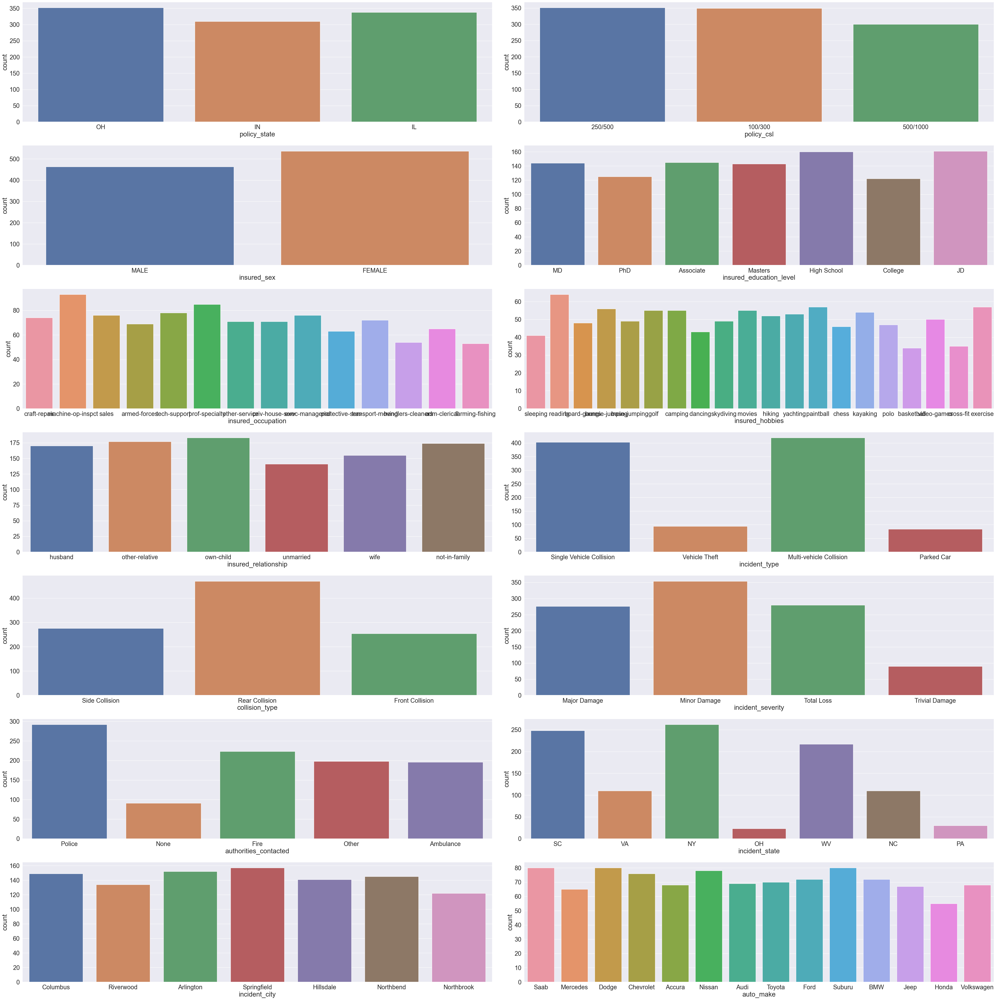

In [37]:
fig,ax = plt.subplots(nrows=7,ncols=2,figsize=(50,50))

for col,subplot in zip(X_cat.columns,ax.flatten()):
    sns.countplot(x=X_cat[col],ax=subplot)
plt.tight_layout()
plt.show()

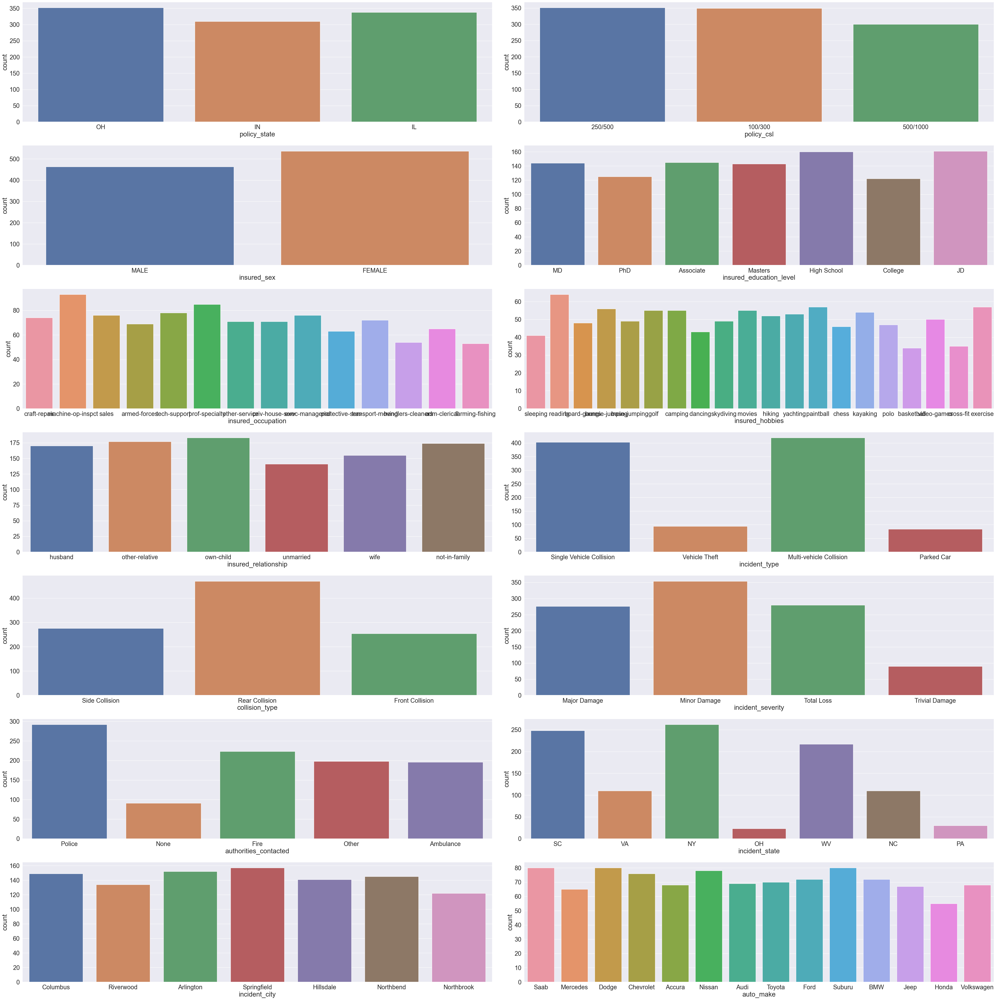

In [38]:
fig,ax = plt.subplots(nrows=7,ncols=2,figsize=(50,50))

for col,subplot in zip(X_cat.columns,ax.flatten()):
    sns.countplot(x=X_cat[col],ax=subplot)
plt.tight_layout()
plt.show()

In [39]:
# Features are fairly balanced.

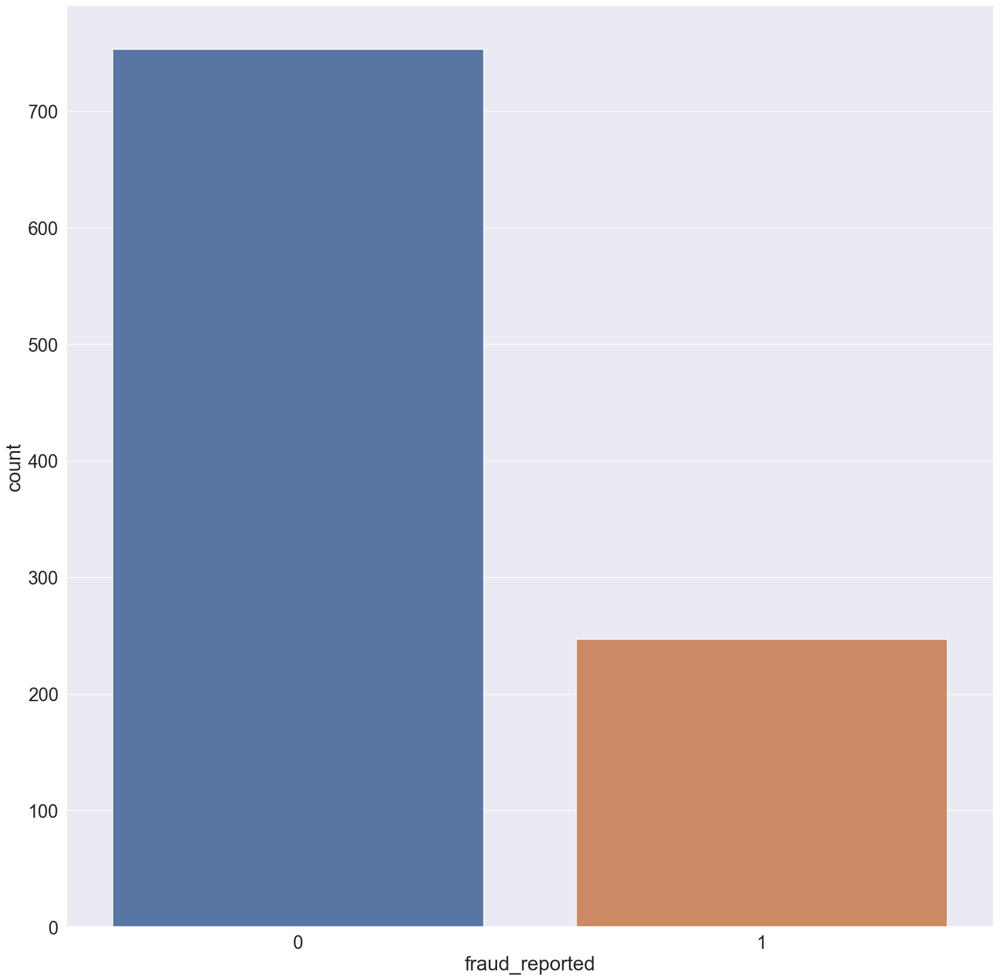

In [40]:
sns.countplot(x=y);

In [41]:
# Target column is imbalanced.

# Data Preprocessing

In [42]:
X_cat.head()

,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,auto_make
0,OH,250/500,MALE,MD,craft-repair,sleeping,husband,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,Saab
1,IN,250/500,MALE,MD,machine-op-inspct,reading,other-relative,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,Mercedes
2,OH,100/300,FEMALE,PhD,sales,board-games,own-child,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,Dodge
3,IL,250/500,FEMALE,PhD,armed-forces,board-games,unmarried,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,Chevrolet
4,IL,500/1000,MALE,Associate,sales,board-games,unmarried,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,Accura


In [43]:
# Encoding
le = LabelEncoder()

for i in X_cat.columns:
    label = le.fit_transform(X_cat[i])
    X_cat[i] = label
X_cat.head(2)

,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,auto_make
0,2,1,1,4,2,17,0,2,2,0,4,4,1,10
1,1,1,1,4,6,15,2,3,1,1,4,5,5,8


In [44]:
X_cat.head(5)

,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,auto_make
0,2,1,1,4,2,17,0,2,2,0,4,4,1,10
1,1,1,1,4,6,15,2,3,1,1,4,5,5,8
2,2,0,0,6,11,2,3,0,1,1,4,1,1,4
3,0,1,0,6,1,2,4,2,0,0,4,2,0,3
4,0,2,1,0,11,2,4,3,1,1,2,1,0,0


In [45]:
X_num.head(2)

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
0,328,48,1000,1406.91,0,466132,53300,0,1,1,2,71610,6510,13020,52080,2004
1,228,42,2000,1197.22,5000000,468176,0,0,1,0,0,5070,780,780,3510,2007


In [46]:
X_num.skew()

months_as_customer             0.36218
age                            0.47899
policy_deductable              0.47789
policy_annual_premium          0.00440
umbrella_limit                 1.80671
insured_zip                    0.81655
capital-gains                  0.47885
capital-loss                  -0.39147
number_of_vehicles_involved    0.50266
bodily_injuries                0.01478
witnesses                      0.01964
total_claim_amount            -0.59458
injury_claim                   0.26481
property_claim                 0.37817
vehicle_claim                 -0.62110
auto_year                     -0.04829
dtype: float64

In [47]:
#X_num['umbrella_limit'] = np.power((X_num['umbrella_limit']),3)

In [48]:
#X_num['umbrella_limit'] 

In [49]:
# normalize the numerical value

In [50]:
X_num.head()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
0,328,48,1000,1406.91,0,466132,53300,0,1,1,2,71610,6510,13020,52080,2004
1,228,42,2000,1197.22,5000000,468176,0,0,1,0,0,5070,780,780,3510,2007
2,134,29,2000,1413.14,5000000,430632,35100,0,3,2,3,34650,7700,3850,23100,2007
3,256,41,2000,1415.74,6000000,608117,48900,-62400,1,1,2,63400,6340,6340,50720,2014
4,228,44,1000,1583.91,6000000,610706,66000,-46000,1,0,1,6500,1300,650,4550,2009


In [51]:
# Feature Scaling
scaler = MinMaxScaler()
scaled = scaler.fit_transform(X_num)
X_num_scaled = pd.DataFrame(scaled,columns=X_num.columns)
X_num_scaled.head()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
0,0.68476,0.64444,0.33333,0.60311,0.09091,0.18877,0.53035,1.00000,0.00000,0.5,0.66667,0.62280,0.30350,0.55006,0.65430,0.45
1,0.47599,0.51111,1.00000,0.47321,0.54545,0.19948,0.00000,1.00000,0.00000,0.0,0.00000,0.04329,0.03636,0.03295,0.04328,0.60
2,0.27975,0.22222,1.00000,0.60697,0.54545,0.00277,0.34925,1.00000,0.66667,1.0,1.00000,0.30091,0.35897,0.16265,0.28972,0.60
3,0.53445,0.48889,1.00000,0.60858,0.63636,0.93270,0.48657,0.43834,0.00000,0.5,0.66667,0.55130,0.29557,0.26785,0.63719,0.95
4,0.47599,0.55556,0.33333,0.71276,0.63636,0.94626,0.65672,0.58596,0.00000,0.0,0.33333,0.05574,0.06061,0.02746,0.05636,0.70


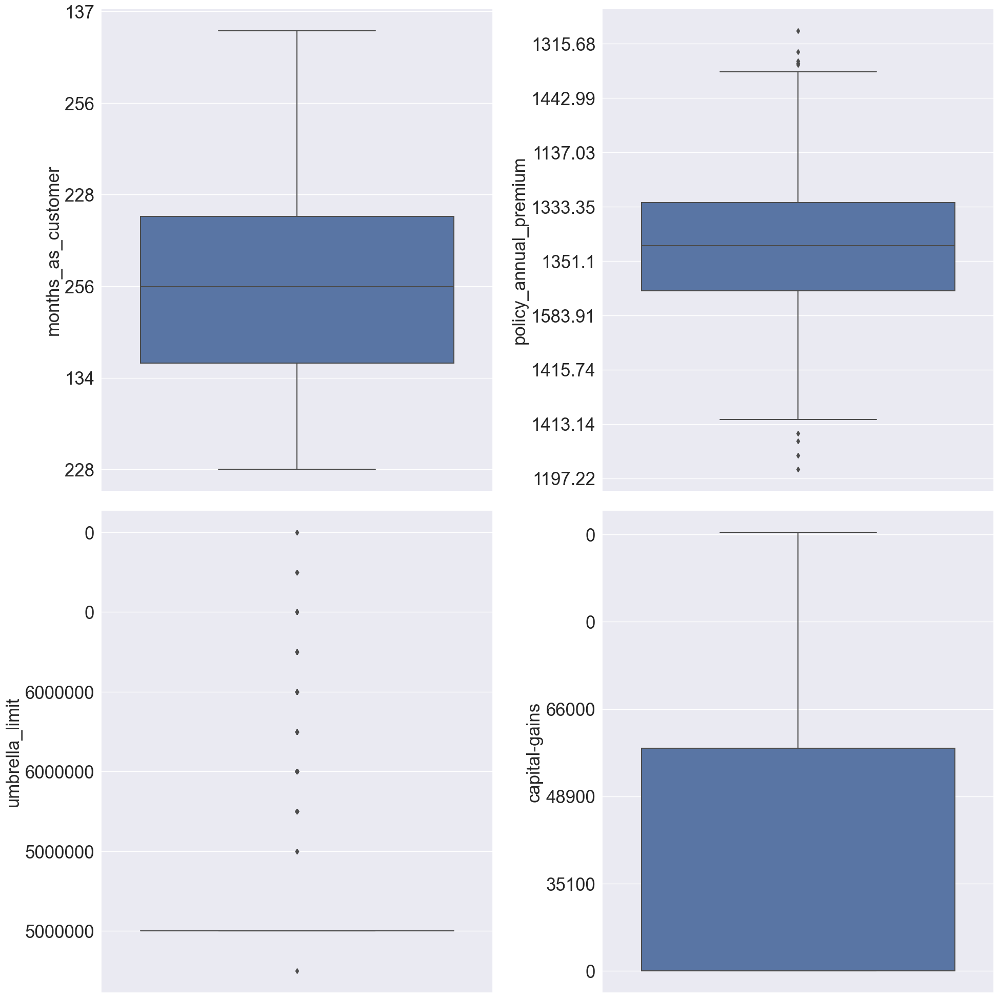

In [53]:
X_num = X_num.copy()

fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(20,20),squeeze=True)

collist = ['months_as_customer','policy_annual_premium','umbrella_limit','capital-gains']


X_num_copy = X_num[collist]
for col,subplot in zip(X_num_copy.columns,ax.flatten()):
    sns.boxplot(y=X_num_copy[col],ax=subplot)
    subplot.set_ylabel(col,fontsize=25)
    subplot.set_yticklabels(labels=X_num_copy[col],fontsize=25)
plt.tight_layout()
plt.show()

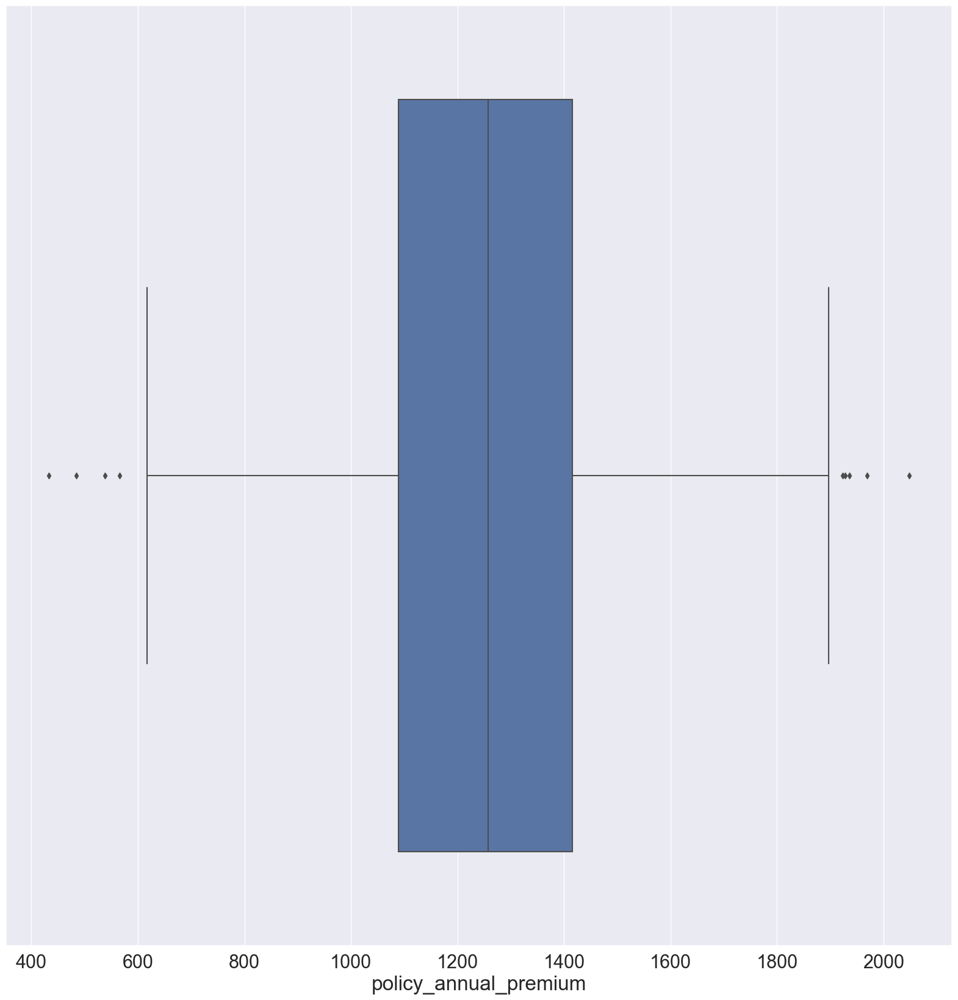

In [54]:
sns.boxplot(x=X_num['policy_annual_premium'])
plt.show()

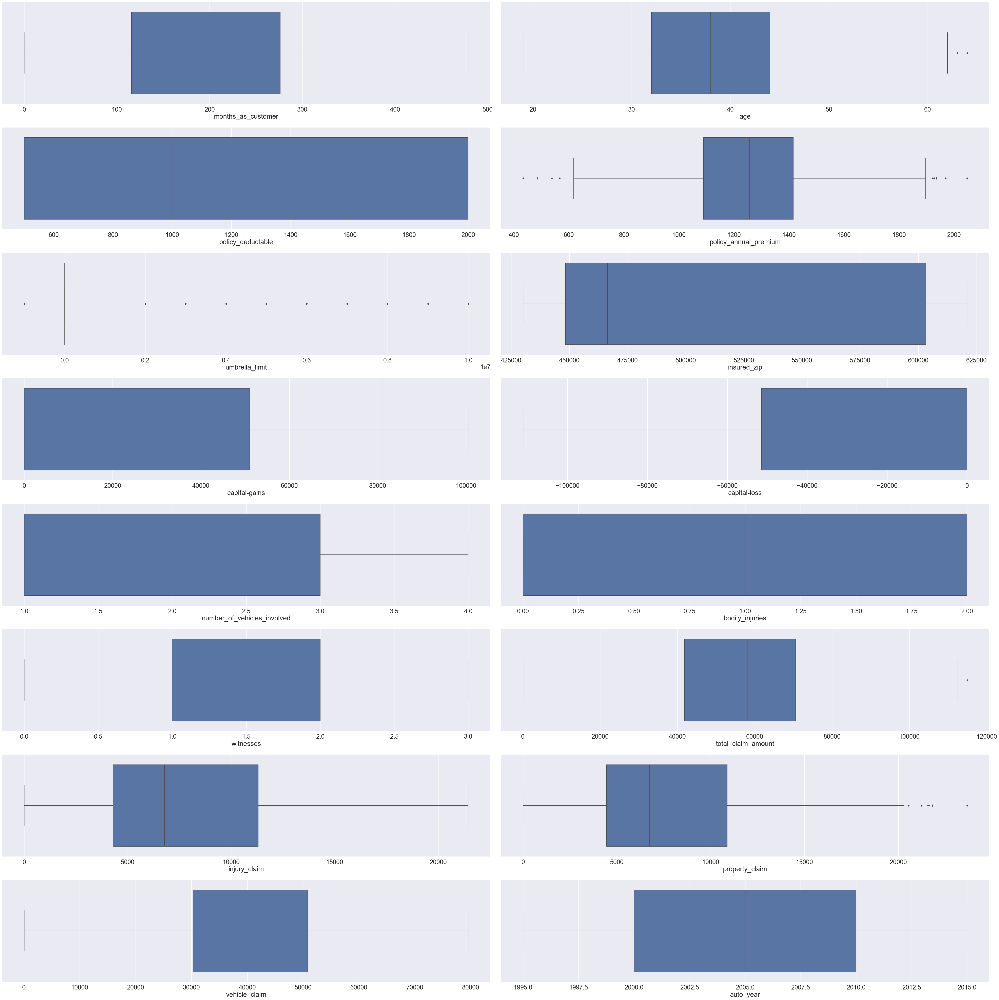

In [55]:
fig,ax = plt.subplots(nrows=8,ncols=2,figsize=(50,50),squeeze=True)

for col,subplot in zip(X_num.columns,ax.flatten()):
    sns.boxplot(x=X_num[col],ax=subplot)
plt.tight_layout()
plt.show()

In [56]:
# There are outliers present for columns  policy_annual_premium,umbrella_limit and property_claim columns

In [57]:
X_num_scaled.skew()

months_as_customer             0.36218
age                            0.47899
policy_deductable              0.47789
policy_annual_premium          0.00440
umbrella_limit                 1.80671
insured_zip                    0.81655
capital-gains                  0.47885
capital-loss                  -0.39147
number_of_vehicles_involved    0.50266
bodily_injuries                0.01478
witnesses                      0.01964
total_claim_amount            -0.59458
injury_claim                   0.26481
property_claim                 0.37817
vehicle_claim                 -0.62110
auto_year                     -0.04829
dtype: float64

In [58]:
# umbrella_limit column is right skewed is due to high outliers

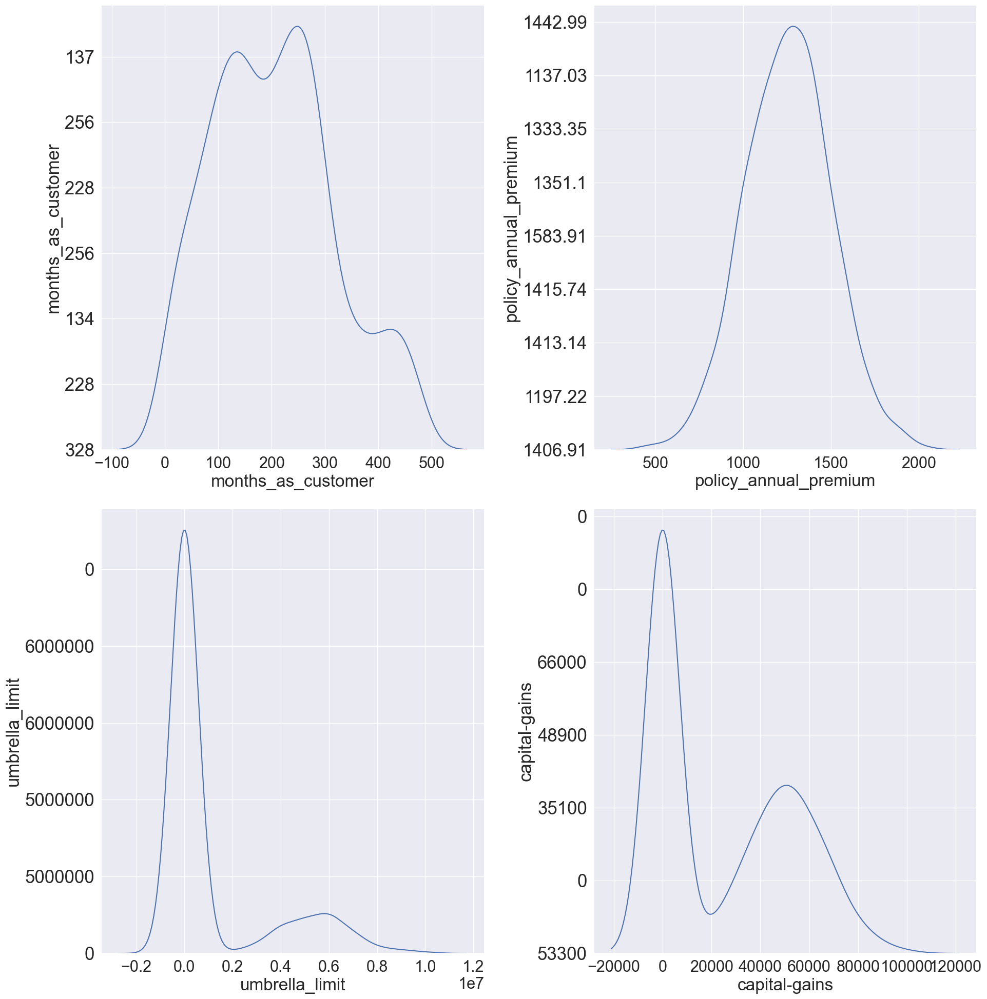

In [59]:
X_num = X_num.copy()

fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(20,20),squeeze=True)

collist = ['months_as_customer','policy_annual_premium','umbrella_limit','capital-gains']


X_num_copy = X_num[collist]
for col,subplot in zip(X_num_copy.columns,ax.flatten()):
    sns.distplot(a=X_num_copy[col],ax=subplot,hist=False)
    subplot.set_ylabel(col,fontsize=25)
    subplot.set_yticklabels(labels=X_num_copy[col],fontsize=25)
plt.tight_layout()
plt.show()

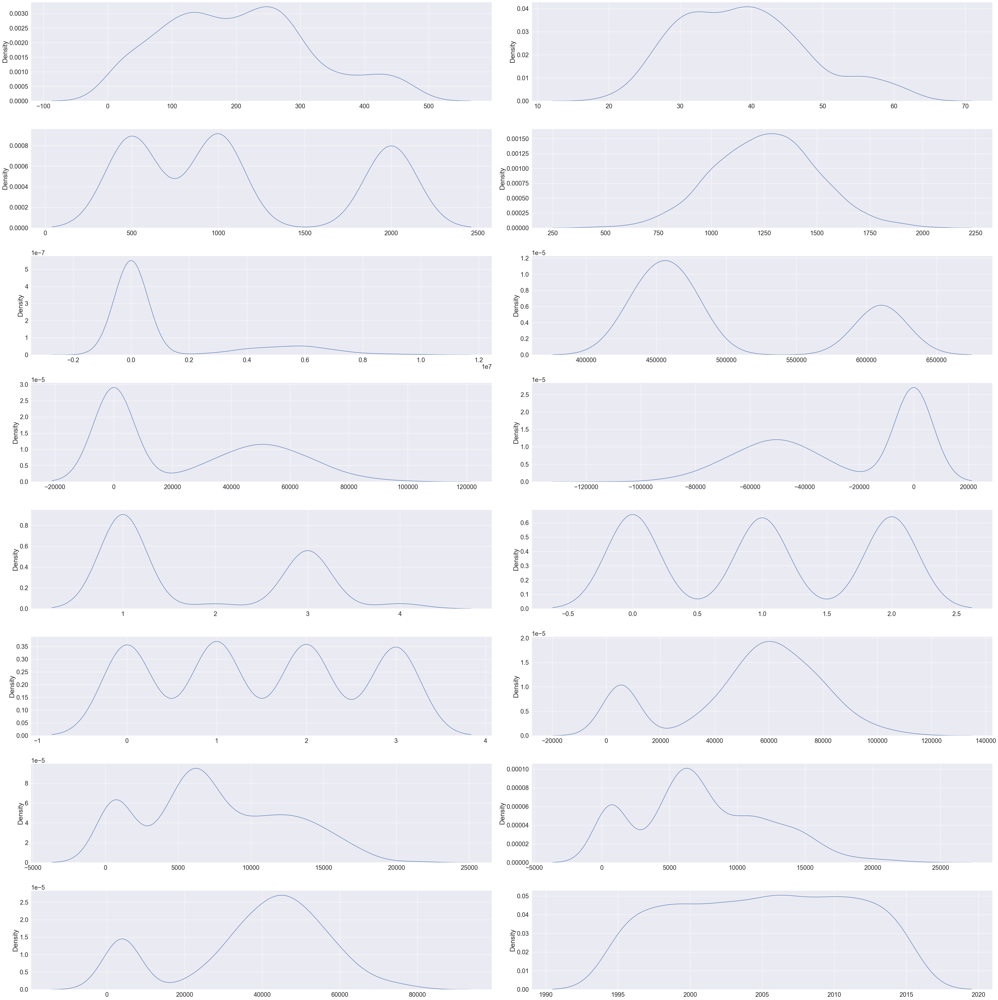

In [60]:
fig,ax = plt.subplots(nrows=8,ncols=2,figsize=(50,50),squeeze=True)

for col,subplot in zip(X_num.columns,ax.flatten()):
    sns.distplot(x=X_num[col],ax=subplot,hist=False)
plt.tight_layout()
plt.show()

In [61]:
X_new = pd.concat([X_num_scaled,X_cat],axis=1)
X_new.head()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,auto_make
0,0.68476,0.64444,0.33333,0.60311,0.09091,0.18877,0.53035,1.00000,0.00000,0.5,0.66667,0.62280,0.30350,0.55006,0.65430,0.45,2,1,1,4,2,17,0,2,2,0,4,4,1,10
1,0.47599,0.51111,1.00000,0.47321,0.54545,0.19948,0.00000,1.00000,0.00000,0.0,0.00000,0.04329,0.03636,0.03295,0.04328,0.60,1,1,1,4,6,15,2,3,1,1,4,5,5,8
2,0.27975,0.22222,1.00000,0.60697,0.54545,0.00277,0.34925,1.00000,0.66667,1.0,1.00000,0.30091,0.35897,0.16265,0.28972,0.60,2,0,0,6,11,2,3,0,1,1,4,1,1,4
3,0.53445,0.48889,1.00000,0.60858,0.63636,0.93270,0.48657,0.43834,0.00000,0.5,0.66667,0.55130,0.29557,0.26785,0.63719,0.95,0,1,0,6,1,2,4,2,0,0,4,2,0,3
4,0.47599,0.55556,0.33333,0.71276,0.63636,0.94626,0.65672,0.58596,0.00000,0.0,0.33333,0.05574,0.06061,0.02746,0.05636,0.70,0,2,1,0,11,2,4,3,1,1,2,1,0,0


In [62]:
df_insurance_claims_new = pd.concat([X_new,y],axis=1)
df_insurance_claims_new.head(2)

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,auto_make,fraud_reported
0,0.68476,0.64444,0.33333,0.60311,0.09091,0.18877,0.53035,1.0,0.0,0.5,0.66667,0.62280,0.30350,0.55006,0.65430,0.45,2,1,1,4,2,17,0,2,2,0,4,4,1,10,1
1,0.47599,0.51111,1.00000,0.47321,0.54545,0.19948,0.00000,1.0,0.0,0.0,0.00000,0.04329,0.03636,0.03295,0.04328,0.60,1,1,1,4,6,15,2,3,1,1,4,5,5,8,1


In [63]:
df_insurance_claims_new.corr()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,auto_make,fraud_reported
months_as_customer,1.00000,0.92210,0.02681,0.00502,0.01550,0.01789,0.00640,0.02021,0.01474,-0.01016,0.05838,0.06211,0.06533,0.03494,0.06101,-0.00029,-0.00033,-0.02682,0.06093,-0.00083,0.00981,-0.09366,0.06973,-0.01738,-0.07279,-0.05958,0.01002,0.00537,-0.00013,0.04766,0.02054
age,0.92210,1.00000,0.02919,0.01440,0.01813,0.02560,-0.00708,0.00737,0.02210,-0.01568,0.05236,0.06986,0.07552,0.06090,0.06259,0.00135,-0.01453,-0.01518,0.07334,0.00097,0.01722,-0.08132,0.07483,-0.02563,-0.07564,-0.05844,0.01542,0.00577,-0.00229,0.03041,0.01214
policy_deductable,0.02681,0.02919,1.00000,-0.00325,0.01087,0.00454,0.03521,-0.02354,0.05121,-0.02276,0.06664,0.02284,0.03911,0.06479,0.00527,0.02610,0.01003,0.00338,-0.00973,0.01522,-0.04673,0.00406,-0.02294,-0.03841,-0.05391,-0.01571,-0.00076,0.00652,-0.04512,-0.03538,0.01482
policy_annual_premium,0.00502,0.01440,-0.00325,1.00000,-0.00625,0.03235,-0.01374,0.02355,-0.04599,0.02678,0.00233,0.00909,-0.01763,-0.01165,0.02025,-0.04923,0.01246,0.02398,0.03885,-0.01972,0.03592,-0.01802,0.00193,0.05360,0.03656,-0.01116,-0.05519,0.04643,0.04872,0.00005,-0.01448
umbrella_limit,0.01550,0.01813,0.01087,-0.00625,1.00000,0.01967,-0.04727,-0.02406,-0.02127,0.02274,-0.00674,-0.04034,-0.04541,-0.02379,-0.03858,0.00989,-0.02958,0.02164,0.01069,-0.01936,0.02342,-0.03700,0.07750,0.01597,0.01004,0.00947,0.02904,-0.07749,0.01309,-0.00444,0.05862
insured_zip,0.01789,0.02560,0.00454,0.03235,0.01967,1.00000,0.00630,0.04937,0.02745,0.02870,0.01981,-0.03387,-0.01749,-0.00684,-0.04108,-0.03274,0.00878,0.00688,-0.03694,0.01608,-0.06908,0.00211,-0.00236,-0.01084,-0.01688,-0.02385,-0.01755,-0.04767,-0.01753,-0.02089,0.01937
capital-gains,0.00640,-0.00708,0.03521,-0.01374,-0.04727,0.00630,1.00000,-0.04690,0.06164,0.05583,-0.01765,0.01598,0.02593,-0.00078,0.01584,0.03140,0.07455,0.00525,-0.02049,0.03991,-0.00782,0.05434,-0.01944,-0.04586,-0.00617,-0.01340,-0.04489,0.01383,-0.02499,0.05201,-0.01917
capital-loss,0.02021,0.00737,-0.02354,0.02355,-0.02406,0.04937,-0.04690,1.00000,-0.01489,-0.02442,-0.04133,-0.03606,-0.04606,-0.02286,-0.03267,-0.05662,-0.03034,-0.03461,-0.02171,0.04119,-0.02017,-0.03181,-0.06445,0.02610,0.04149,-0.01865,0.02519,-0.04865,-0.03809,-0.04166,-0.01486
number_of_vehicles_involved,0.01474,0.02210,0.05121,-0.04599,-0.02127,0.02745,0.06164,-0.01489,1.00000,0.01403,-0.01467,0.27428,0.22465,0.21908,0.26939,0.03455,-0.04226,-0.01940,0.01879,-0.00377,-0.01537,0.01259,-0.04735,-0.89327,0.07900,-0.16872,-0.08151,-0.03738,-0.00984,0.01434,0.05184
bodily_injuries,-0.01016,-0.01568,-0.02276,0.02678,0.02274,0.02870,0.05583,-0.02442,0.01403,1.00000,-0.00561,0.04709,0.04732,0.03975,0.04345,-0.02053,0.01338,-0.00059,-0.02030,-0.01207,-0.00024,0.03137,-0.00121,-0.00973,-0.01815,-0.01887,0.04169,-0.00004,0.05178,0.02673,0.03388


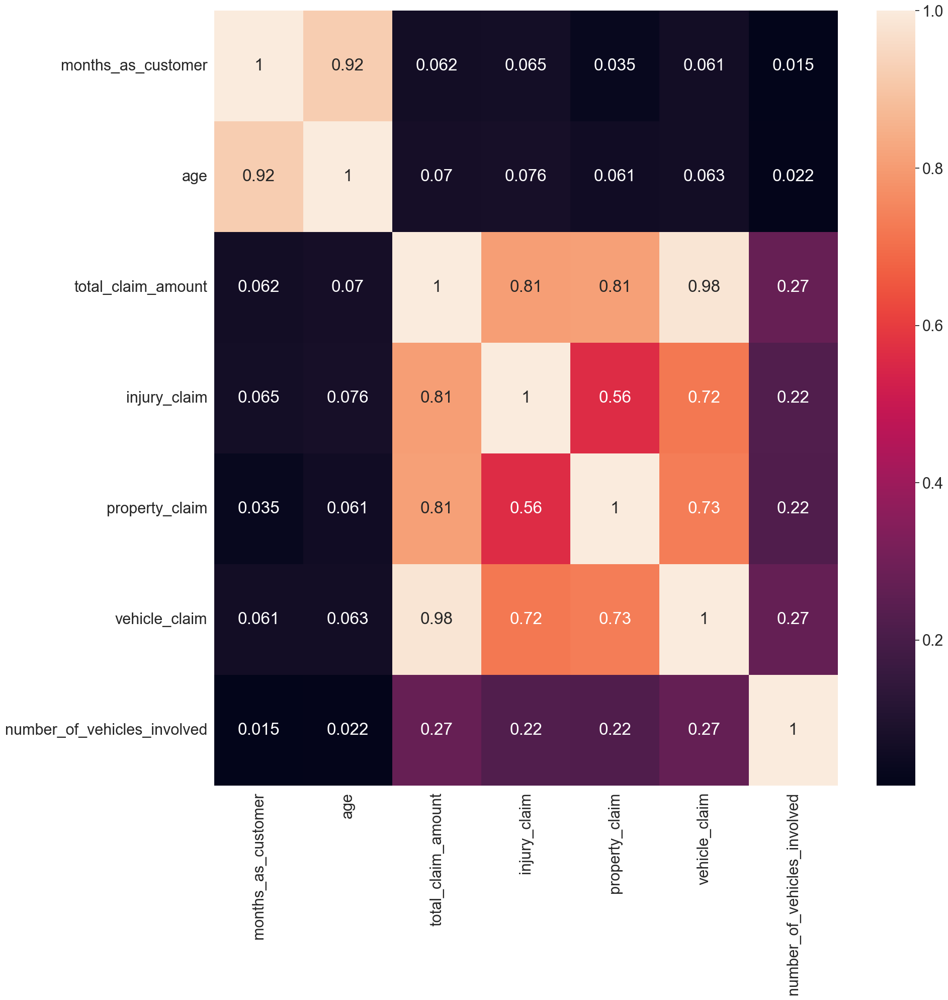

In [64]:
plt.figure(figsize=(20,20))
df_insurance_claims_new_copy = df_insurance_claims.copy()
df_insurance_claims_new_copy = df_insurance_claims_new_copy[['months_as_customer','age','total_claim_amount',
                                                             'injury_claim','property_claim',
                                                            'vehicle_claim','incident_type','number_of_vehicles_involved']]

sns.heatmap(df_insurance_claims_new_copy.corr(),annot=True);

In [65]:
df_insurance_claims.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'umbrella_limit',
       'insured_zip', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'capital-gains', 'capital-loss', 'incident_type', 'collision_type',
       'incident_severity', 'authorities_contacted', 'incident_state',
       'incident_city', 'number_of_vehicles_involved', 'property_damage',
       'bodily_injuries', 'witnesses', 'police_report_available',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
       'auto_make', 'auto_year', 'fraud_reported'],
      dtype='object')

In [394]:
corr_matrix = df_insurance_claims_new.corr()
print(corr_matrix["fraud_reported"].sort_values(ascending=False))

fraud_reported                 1.00000
vehicle_claim                  0.17005
total_claim_amount             0.16365
property_claim                 0.13784
injury_claim                   0.09097
umbrella_limit                 0.05862
number_of_vehicles_involved    0.05184
witnesses                      0.04950
bodily_injuries                0.03388
insured_sex                    0.03087
policy_state                   0.02943
insured_relationship           0.02104
months_as_customer             0.02054
insured_zip                    0.01937
policy_deductable              0.01482
age                            0.01214
insured_education_level        0.00881
auto_year                      0.00793
insured_occupation             0.00156
policy_annual_premium         -0.01448
capital-loss                  -0.01486
collision_type                -0.01732
capital-gains                 -0.01917
auto_make                     -0.02752
policy_csl                    -0.03719
incident_city            

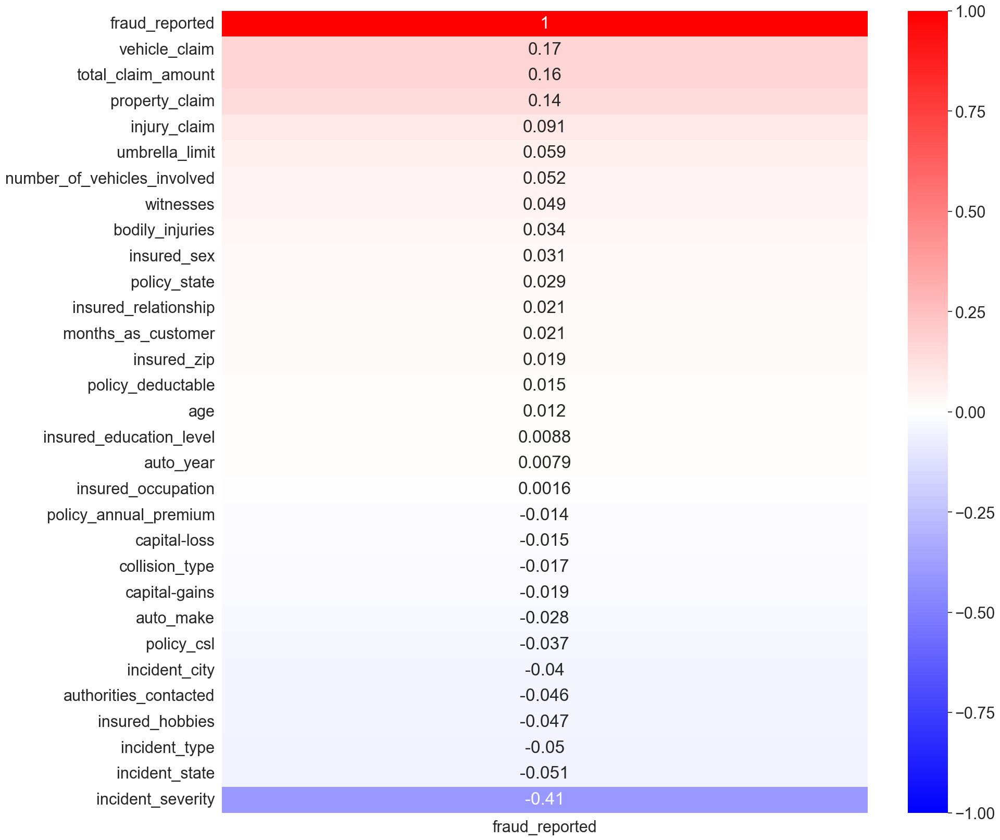

In [396]:
data=pd.DataFrame(corr_matrix["fraud_reported"].sort_values(ascending=False)); 

ax = sns.heatmap(data, annot=True, vmin=-1, vmax=1, cmap='bwr') 
ax.tick_params(labelrotation=0);

In [386]:
df_insurance_claims_new.corr().loc[['fraud_reported']]

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,auto_make,fraud_reported
fraud_reported,0.02054,0.01214,0.01482,-0.01448,0.05862,0.01937,-0.01917,-0.01486,0.05184,0.03388,0.0495,0.16365,0.09097,0.13784,0.17005,0.00793,0.02943,-0.03719,0.03087,0.00881,0.00156,-0.04684,0.02104,-0.05038,-0.01732,-0.40599,-0.0458,-0.05141,-0.0404,-0.02752,1.0


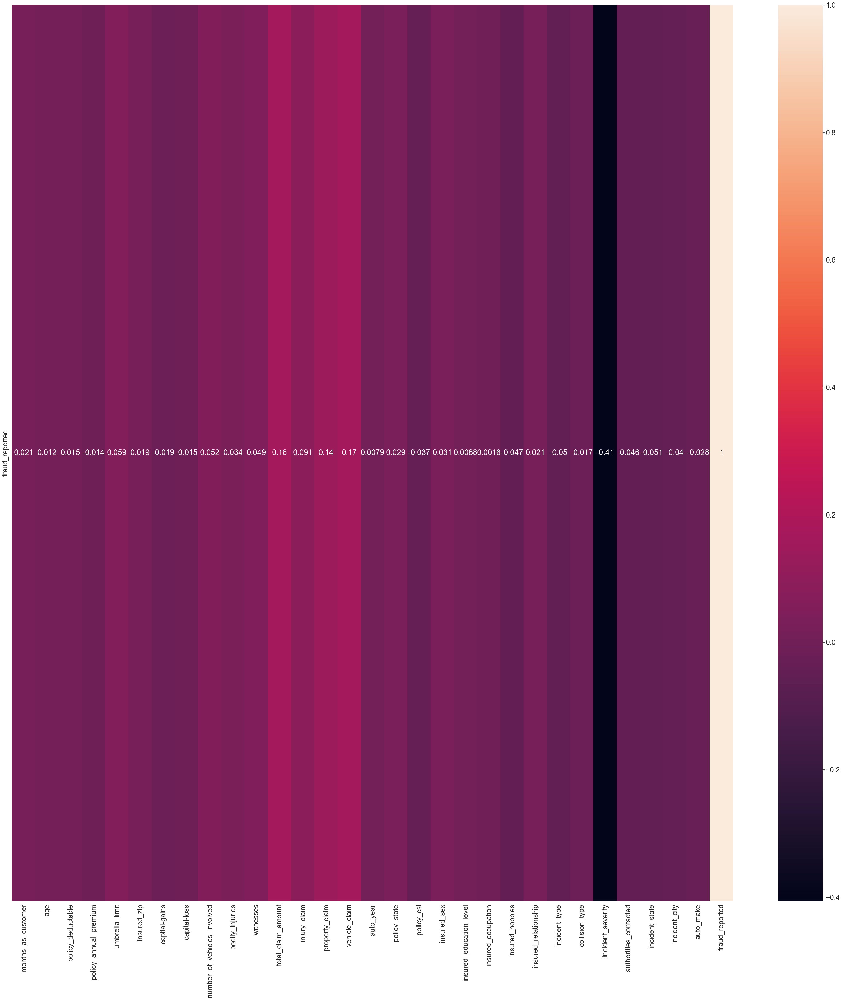

In [393]:
plt.figure(figsize=(50,50))
sns.heatmap(df_insurance_claims_new.corr().loc[['fraud_reported']],annot=True);

In [381]:
df_insurance_claims_new.corr().loc[['fraud_reported']]

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,auto_make,fraud_reported
fraud_reported,0.02054,0.01214,0.01482,-0.01448,0.05862,0.01937,-0.01917,-0.01486,0.05184,0.03388,0.0495,0.16365,0.09097,0.13784,0.17005,0.00793,0.02943,-0.03719,0.03087,0.00881,0.00156,-0.04684,0.02104,-0.05038,-0.01732,-0.40599,-0.0458,-0.05141,-0.0404,-0.02752,1.0


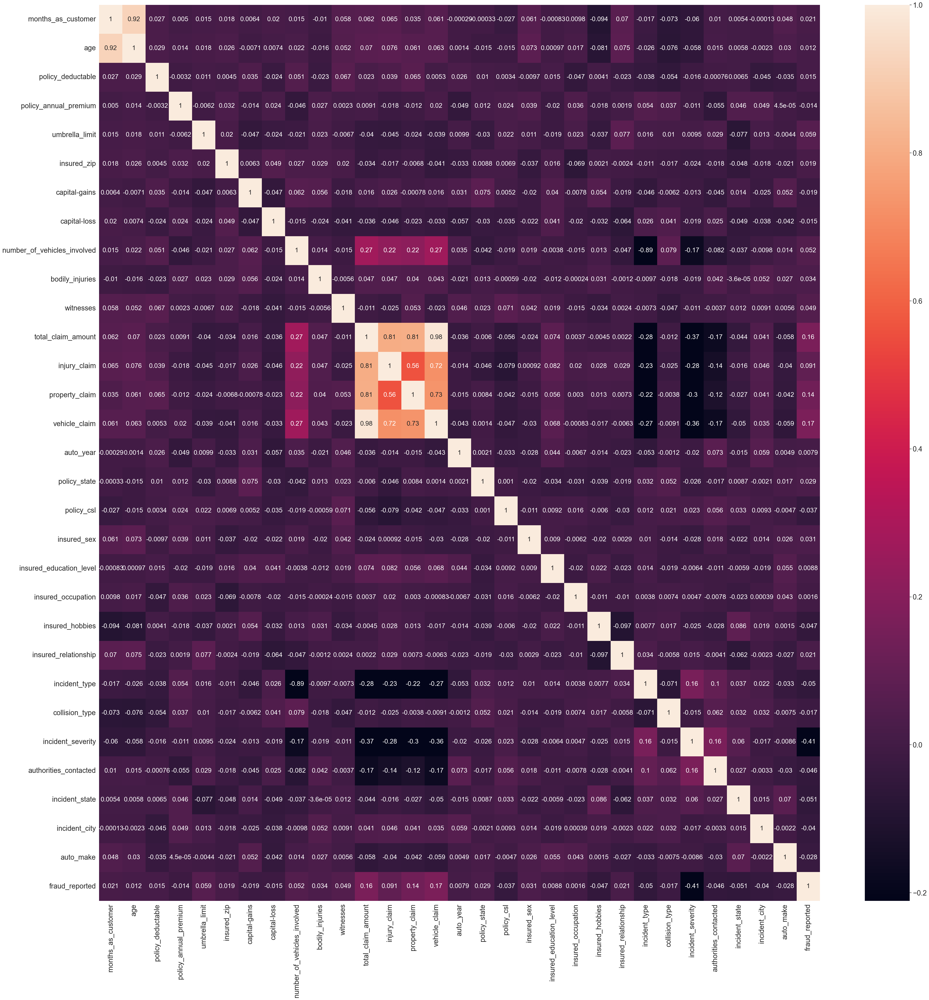

In [66]:
plt.figure(figsize=(50,50))
sns.heatmap(df_insurance_claims_new.corr(),annot=True,fmt='.2g',annot_kws={'size':20},robust=True);

In [67]:
# We can see the there some high correlation between some indenpendent variable so there is chance of multicolinearity
# Let check with VIF

In [68]:
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(X_new.values,i) for i in range(X_new.shape[1])]
vif['Feature'] = X_new.columns
vif.sort_values(by='VIF',ascending=False)

,VIF,Feature
11,3.51514e+08,total_claim_amount
14,1.81286e+08,vehicle_claim
12,8.00917e+06,injury_claim
13,7.90364e+06,property_claim
0,6.82458e+00,months_as_customer
1,6.82113e+00,age
23,5.08681e+00,incident_type
8,5.08571e+00,number_of_vehicles_involved
25,1.19308e+00,incident_severity
26,1.07656e+00,authorities_contacted


In [69]:
vif = pd.DataFrame()
X_new_vif = X_new.drop(['injury_claim'],axis=1)
vif['VIF'] = [variance_inflation_factor(X_new_vif.values,i) for i in range(X_new_vif.shape[1])]
vif['Feature'] = X_new_vif.columns
vif.sort_values(by='VIF',ascending=False)

,VIF,Feature
11,317.34958,total_claim_amount
13,235.68491,vehicle_claim
1,38.50982,age
0,28.11494,months_as_customer
12,15.53641,property_claim
3,11.51286,policy_annual_premium
22,9.04551,incident_type
7,8.89782,capital-loss
8,7.14555,number_of_vehicles_involved
20,3.91075,insured_hobbies


In [70]:
vif = pd.DataFrame()
X_new_vif = X_new.drop(['injury_claim','total_claim_amount'],axis=1)
vif['VIF'] = [variance_inflation_factor(X_new_vif.values,i) for i in range(X_new_vif.shape[1])]
vif['Feature'] = X_new_vif.columns
vif.sort_values(by='VIF',ascending=False)

,VIF,Feature
1,38.47448,age
0,28.10769,months_as_customer
3,11.48904,policy_annual_premium
12,11.35065,vehicle_claim
21,9.04308,incident_type
7,8.89187,capital-loss
11,7.49933,property_claim
8,7.14546,number_of_vehicles_involved
19,3.89921,insured_hobbies
13,3.73366,auto_year


In [71]:
vif = pd.DataFrame()
X_new_vif = X_new.drop(['injury_claim','total_claim_amount','age'],axis=1)
vif['VIF'] = [variance_inflation_factor(X_new_vif.values,i) for i in range(X_new_vif.shape[1])]
vif['Feature'] = X_new_vif.columns
vif.sort_values(by='VIF',ascending=False)

,VIF,Feature
2,11.41628,policy_annual_premium
11,11.34789,vehicle_claim
20,9.01814,incident_type
6,8.88505,capital-loss
10,7.44247,property_claim
7,7.11954,number_of_vehicles_involved
0,4.19529,months_as_customer
18,3.88998,insured_hobbies
12,3.72716,auto_year
17,3.65099,insured_occupation


In [72]:
vif = pd.DataFrame()
X_new_vif = X_new.drop(['injury_claim','total_claim_amount','age','number_of_vehicles_involved'],axis=1)
vif['VIF'] = [variance_inflation_factor(X_new_vif.values,i) for i in range(X_new_vif.shape[1])]
vif['Feature'] = X_new_vif.columns
vif.sort_values(by='VIF',ascending=False)

,VIF,Feature
2,11.16786,policy_annual_premium
10,11.06412,vehicle_claim
6,8.54592,capital-loss
9,7.44237,property_claim
0,4.17540,months_as_customer
17,3.81050,insured_hobbies
11,3.70289,auto_year
16,3.63459,insured_occupation
25,3.58368,auto_make
15,3.34766,insured_education_level


In [73]:
vif = pd.DataFrame()
X_new_vif = X_new.drop(['injury_claim','total_claim_amount','months_as_customer','number_of_vehicles_involved','property_claim'],axis=1)
vif['VIF'] = [variance_inflation_factor(X_new_vif.values,i) for i in range(X_new_vif.shape[1])]
vif['Feature'] = X_new_vif.columns
vif.sort_values(by='VIF',ascending=False)

,VIF,Feature
2,11.19026,policy_annual_premium
6,8.55928,capital-loss
0,5.69911,age
9,5.41166,vehicle_claim
16,3.80049,insured_hobbies
10,3.70824,auto_year
15,3.64163,insured_occupation
24,3.57897,auto_make
14,3.34853,insured_education_level
22,3.30941,incident_state


In [74]:
vif = pd.DataFrame()
X_new_vif = X_new.drop(['injury_claim','total_claim_amount','months_as_customer','number_of_vehicles_involved',
                        'property_claim','policy_annual_premium'],axis=1)
vif['VIF'] = [variance_inflation_factor(X_new_vif.values,i) for i in range(X_new_vif.shape[1])]
vif['Feature'] = X_new_vif.columns
vif.sort_values(by='VIF',ascending=False)

,VIF,Feature
5,8.22856,capital-loss
0,5.64929,age
8,5.21882,vehicle_claim
15,3.77940,insured_hobbies
9,3.69685,auto_year
14,3.59129,insured_occupation
23,3.55810,auto_make
13,3.34706,insured_education_level
21,3.26915,incident_state
20,3.15389,authorities_contacted


In [75]:
vif = pd.DataFrame()
X_new_vif = X_new.drop(['injury_claim','total_claim_amount','months_as_customer','number_of_vehicles_involved',
                        'property_claim','policy_annual_premium','capital-loss'],axis=1)
vif['VIF'] = [variance_inflation_factor(X_new_vif.values,i) for i in range(X_new_vif.shape[1])]
vif['Feature'] = X_new_vif.columns
vif.sort_values(by='VIF',ascending=False)

,VIF,Feature
0,5.53310,age
7,5.03989,vehicle_claim
14,3.74255,insured_hobbies
8,3.68215,auto_year
13,3.55720,insured_occupation
22,3.54136,auto_make
12,3.30309,insured_education_level
20,3.26433,incident_state
19,3.12410,authorities_contacted
21,3.07937,incident_city


In [76]:
vif = pd.DataFrame()
X_new_vif = X_new.drop(['injury_claim','total_claim_amount','months_as_customer','number_of_vehicles_involved',
                        'property_claim','policy_annual_premium','capital-loss','age'],axis=1)
vif['VIF'] = [variance_inflation_factor(X_new_vif.values,i) for i in range(X_new_vif.shape[1])]
vif['Feature'] = X_new_vif.columns
vif.sort_values(by='VIF',ascending=False)

,VIF,Feature
6,4.82486,vehicle_claim
13,3.74234,insured_hobbies
7,3.66162,auto_year
12,3.52457,insured_occupation
21,3.50460,auto_make
11,3.29791,insured_education_level
19,3.24404,incident_state
18,3.10078,authorities_contacted
20,3.07335,incident_city
14,2.93082,insured_relationship


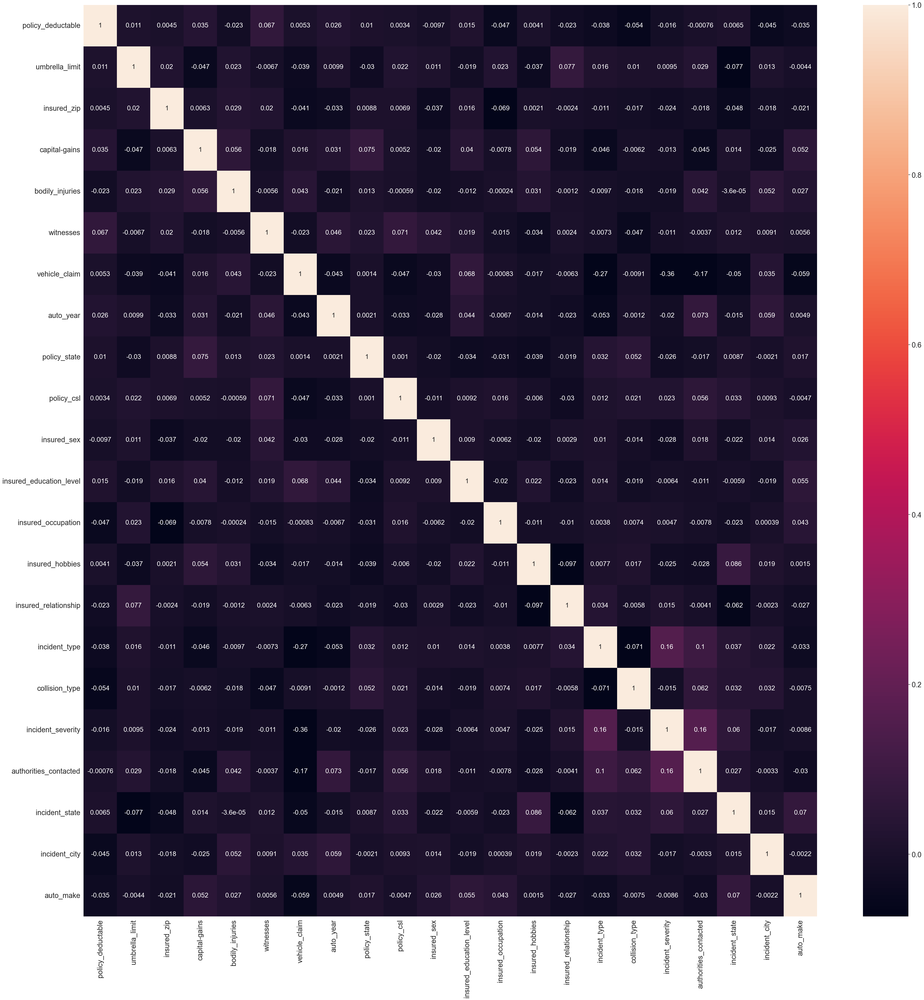

In [77]:
plt.figure(figsize=(50,50))
sns.heatmap(X_new_vif.corr(),annot=True,fmt='.2g',annot_kws={'size':20},robust=True);

In [78]:
# We have successfully remove multicolinearity in the dataset and now we can split the dataset into train and test.

In [79]:
# Split Train and test 
X_train,X_test,y_train,y_test = train_test_split(X_new_vif,y,random_state=10,test_size=0.2)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(800, 22)
(200, 22)
(800,)
(200,)


In [80]:
logit = sm.Logit(y_train,X_train).fit()
logit.summary()

Optimization terminated successfully.
         Current function value: 0.438885
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:         fraud_reported   No. Observations:                  800
Model:                          Logit   Df Residuals:                      778
Method:                           MLE   Df Model:                           21
Date:                Tue, 27 Jun 2023   Pseudo R-squ.:                  0.2157
Time:                        22:45:03   Log-Likelihood:                -351.11
converged:                       True   LL-Null:                       -447.66
Covariance Type:            nonrobust   LLR p-value:                 8.212e-30
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
policy_deductable          -0.0483      0.225     -0.215      0.830      -0.489       0.392
umbrella_limit              0.7852      0.433      1.815      0.070      -0.063       1.633
insured_zip                 0.0418      0.247      0.169      0.866      -0.442       0.526
capital-gains              -0.3056      0.338     -0.903      0.366      -0.969       0.358
bodily_injuries             0.1589      0.232      0.686      0.493      -0.295       0.613
witnesses                   0.3114      0.255      1.223      0.221      -0.188       0.810
vehicle_claim               0.9096      0.419      2.171      0.030       0.089       1.731
auto_year                   0.0153      0.303      0.051      0.960      -0.578       0.609
policy_state                0.1095      0.112      0.977      0.328      -0.110       0.329
policy_csl                 -0.0526      0.116     -0.453      0.651      -0.280       0.175
insured_sex                 0.0222      0.186      0.120      0.905      -0.341       0.386
insured_education_level    -0.0068      0.047     -0.144      0.885      -0.099       0.086
insured_occupation         -0.0087      0.022     -0.386      0.699      -0.053       0.035
insured_hobbies            -0.0217      0.016     -1.360      0.174      -0.053       0.010
insured_relationship        0.0507      0.054      0.932      0.352      -0.056       0.157
incident_type              -0.0003      0.090     -0.004      0.997      -0.177       0.177
collision_type             -0.1465      0.123     -1.195      0.232      -0.387       0.094
incident_severity          -1.4310      0.134    -10.699      0.000      -1.693      -1.169
authorities_contacted       0.0617      0.061      1.005      0.315      -0.059       0.182
incident_state             -0.0582      0.044     -1.329      0.184      -0.144       0.028
incident_city              -0.0531      0.046     -1.164      0.244      -0.142       0.036
auto_make                  -0.0308      0.023     -1.318      0.187      -0.077       0.015
===========================================================================================
"""

In [81]:
logit.aic

746.216739818185

In [82]:
df_odds = pd.DataFrame(data=logit.params,columns=['Odds'])
df_odds

,Odds
policy_deductable,-0.04829
umbrella_limit,0.78521
insured_zip,0.04176
capital-gains,-0.30555
bodily_injuries,0.15890
witnesses,0.31139
vehicle_claim,0.90961
auto_year,0.01530
policy_state,0.10948
policy_csl,-0.05261


In [83]:
# Here we can see that incident_severity and vehicle_claim only significant variable

In [84]:
y_pred_proba = logit.predict(X_test)
y_pred = [1 if i>0.5 else 0 for i in y_pred_proba]
print('Accuracy Score : ',accuracy_score(y_true=y_test,y_pred=y_pred))
print('Recall Score : ',recall_score(y_true=y_test,y_pred=y_pred))
print('Precision Score :',precision_score(y_true=y_test,y_pred=y_pred))
print('F1 Score : ',f1_score(y_true=y_test,y_pred=y_pred))
print("Cohen_kappa_score : ",cohen_kappa_score(y_test,y_pred))
print("Roc_auc_score : ",roc_auc_score(y_test,y_pred))

Accuracy Score :  0.79
Recall Score :  0.40816326530612246
Precision Score : 0.6060606060606061
F1 Score :  0.48780487804878053
Cohen_kappa_score :  0.3619930123044205
Roc_auc_score :  0.6610352750371672


In [85]:
confusion_matrix(y_true=y_test,y_pred=y_pred)

array([[138,  13],
       [ 29,  20]], dtype=int64)

In [86]:
print(classification_report(y_true=y_test,y_pred=y_pred))

              precision    recall  f1-score   support

           0       0.83      0.91      0.87       151
           1       0.61      0.41      0.49        49

    accuracy                           0.79       200
   macro avg       0.72      0.66      0.68       200
weighted avg       0.77      0.79      0.77       200



In [87]:
# We can see that accuracy is 79.5%
# Recall is 38%
# Precision is 63%
# f1 score is 48%
# accuracy looks fine but other matrix is not good enough 
# let check other metrics as well

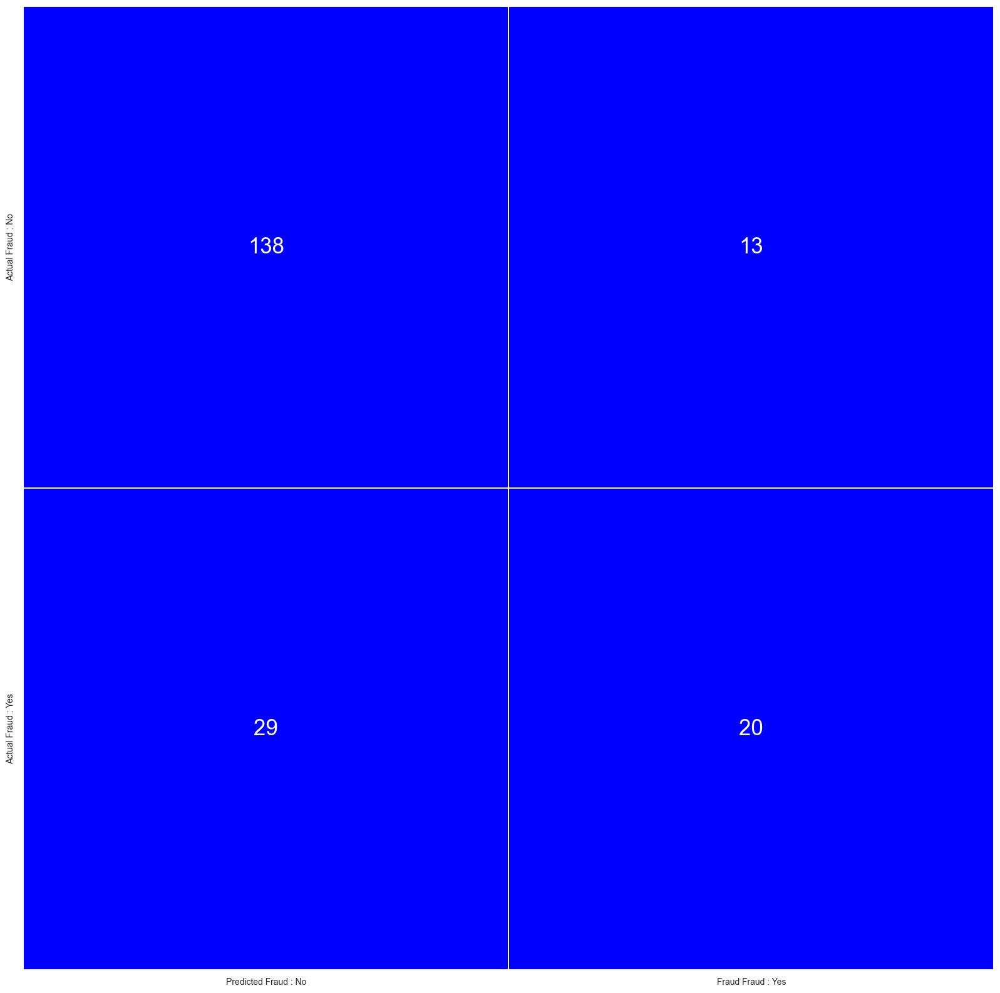

In [88]:
cm =confusion_matrix(y_true=y_test,y_pred=y_pred)

conf_matrix = pd.DataFrame(data=cm,columns=['Predicted Fraud : No','Fraud Fraud : Yes'],
                             index=['Actual Fraud : No','Actual Fraud : Yes'])
sns.heatmap(data=conf_matrix,annot=True,fmt='d',cmap=ListedColormap(['blue']),linewidths=0.2,cbar=False,
            annot_kws={'size':25})

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.show()

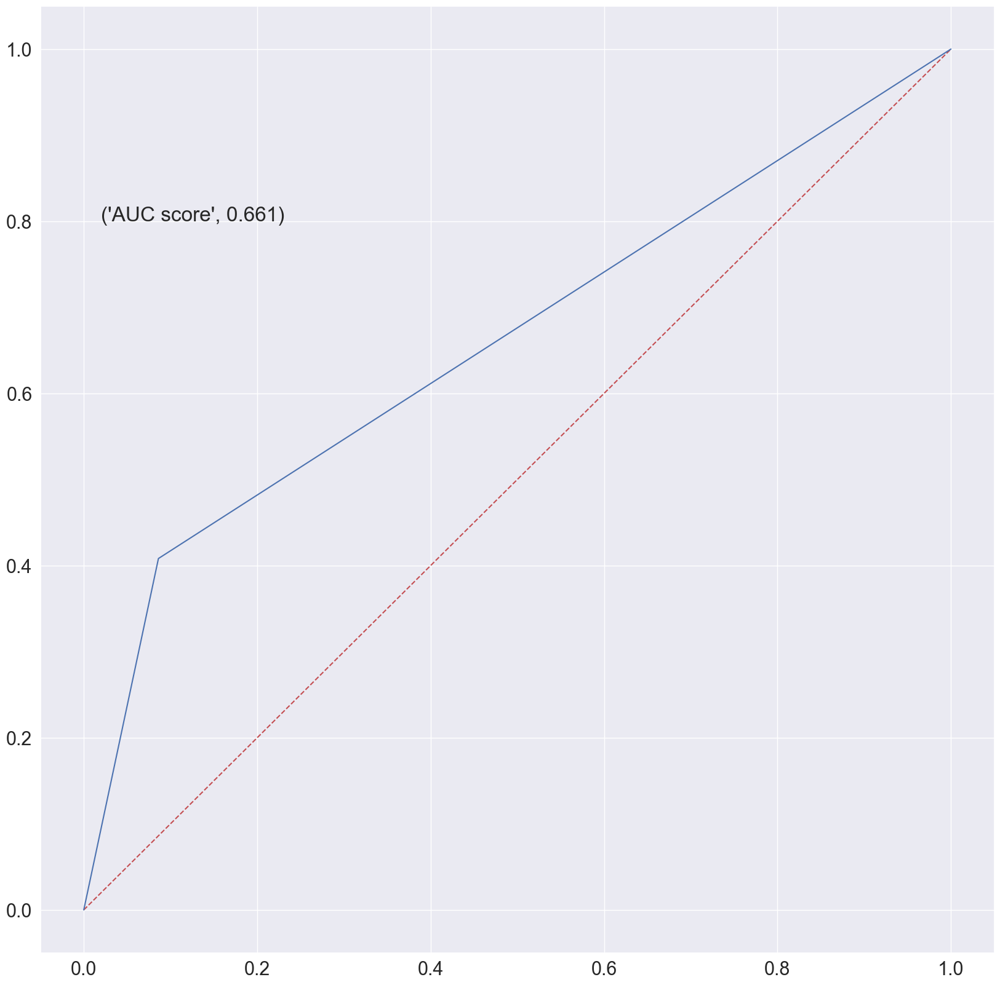

In [89]:
fpr,tpr,thresholds = roc_curve(y_test,y_pred)

plt.plot([0,1],[0,1],'r--')
plt.plot(fpr,tpr)

plt.text(x=0.02,y=0.8,s=('AUC score',round(roc_auc_score(y_test,y_pred),4)))

plt.grid(True)
plt.show()

In [90]:
# We can see that cohen kappa score as 36% which is not good
# also Roc_auc_score is 66% 
# It is due to data imbalance 

In [91]:
# let try to improve performance

# feature selection

In [92]:
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=3,importance_getter='auto')
rfe.fit(X_train,y_train)

feat_index = pd.Series(rfe.ranking_,index=X_train.columns)
signi_feat = feat_index[feat_index==1].index
signi_feat

Index(['umbrella_limit', 'vehicle_claim', 'incident_severity'], dtype='object')

In [93]:
# Rebulidng Model with Significant feature.

In [94]:
X_new_signi = X_new_vif[signi_feat]
X_train_signi,X_test_signi,y_train,y_test = train_test_split(X_new_signi,y,random_state=10,test_size=0.2)

print(X_train_signi.shape)
print(X_test_signi.shape)
print(y_train.shape)
print(y_test.shape)

(800, 3)
(200, 3)
(800,)
(200,)


In [95]:
def eval_metric(model,X_test,y_test):
    y_pred = model.predict(X_test)
    print('Accuracy Score : ',accuracy_score(y_true=y_test,y_pred=y_pred))
    print('Recall Score : ',recall_score(y_true=y_test,y_pred=y_pred))
    print('Precision Score :',precision_score(y_true=y_test,y_pred=y_pred))
    print('F1 Score : ',f1_score(y_true=y_test,y_pred=y_pred))
    print("Cohen_kappa_score : ",cohen_kappa_score(y_test,y_pred))
    print("Roc_auc_score : ",roc_auc_score(y_test,y_pred))
    print('*************************************************************************')
    print("Confusion Matrix :\n ",confusion_matrix(y_true=y_test,y_pred=y_pred))
    print('*************************************************************************')
    print('Classification Report: \n',classification_report(y_true=y_test,y_pred=y_pred))
    

In [96]:
log = LogisticRegression(random_state=10)
log.fit(X_train_signi,y_train)
y_pred = log.predict(X_test_signi)
confusion_matrix(y_true=y_test,y_pred=y_pred)

array([[136,  15],
       [ 30,  19]], dtype=int64)

In [97]:
dt = DecisionTreeClassifier(random_state=10)
dt.fit(X_train_signi,y_train)
y_pred_dt = dt.predict(X_test_signi)
confusion_matrix(y_true=y_test,y_pred=y_pred_dt)

array([[126,  25],
       [ 28,  21]], dtype=int64)

# Bagging 

In [98]:
rf = RandomForestClassifier(random_state=10)
rf.fit(X_train_signi,y_train)
y_pred_rf = rf.predict(X_test_signi)
confusion_matrix(y_true=y_test,y_pred=y_pred_rf)

array([[131,  20],
       [ 28,  21]], dtype=int64)

In [99]:
bg = BaggingClassifier(random_state=10)
bg.fit(X_train_signi,y_train)
y_pred_bg = bg.predict(X_test_signi)
confusion_matrix(y_true=y_test,y_pred=y_pred_bg)

array([[125,  26],
       [ 29,  20]], dtype=int64)

In [100]:
# Random forest is perform better than other model 

### Feature selection and Cross Validation Random forest

In [101]:
def cross_validate(model,n):
    global y_train
    rfe_rf = RFE(estimator=model,n_features_to_select=n,importance_getter='auto')
    rfe_rf.fit(X_train,y_train)

    feat_index_rf = pd.Series(rfe_rf.ranking_,index=X_train.columns)
    signi_feat_rf = feat_index_rf[feat_index_rf==1].index
    X_train_rf = X_train[signi_feat_rf]
    model.fit(X_train_rf,y_train)
    kf =KFold(n_splits=5)
    model.fit(X_train_rf,y_train)
    scores_val_score = cross_val_score(estimator=model,
                                   X=X_train_rf,y=y_train,scoring='roc_auc')
    return scores_val_score,signi_feat_rf

In [102]:
cross_validate(RandomForestClassifier(),3)

(array([0.84739583, 0.860625  , 0.87916667, 0.91640178, 0.89616444]),
 Index(['insured_zip', 'insured_hobbies', 'incident_severity'], dtype='object'))

In [103]:
cross_validate(RandomForestClassifier(),4)

(array([0.84916667, 0.87552083, 0.8821875 , 0.90315745, 0.89129053]),
 Index(['insured_zip', 'vehicle_claim', 'insured_hobbies', 'incident_severity'], dtype='object'))

In [104]:
X_new_signi = X_new_vif[cross_validate(rf,4)[1]]
X_train_signi_rf,X_test_signi_rf,y_train,y_test = train_test_split(X_new_signi,y,random_state=10,test_size=0.2)

print(X_train_signi_rf.shape)
print(X_test_signi_rf.shape)
print(y_train.shape)
print(y_test.shape)

(800, 4)
(200, 4)
(800,)
(200,)


In [105]:
kf =KFold(n_splits=5)
val_predict = cross_val_predict(estimator=RandomForestClassifier(random_state=10),
                                   X=X_test_signi_rf,y=y_test)
val_predict

array([0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0], dtype=int64)

In [106]:
confusion_matrix(y_true=y_test,y_pred=val_predict)

array([[134,  17],
       [ 28,  21]], dtype=int64)

In [107]:
# HyperParameter tuning

In [108]:
param_list = [{'n_estimators':[10,25,50,100,150,200],
              'criterion':['gini','entropy'],
              'max_depth':[None,10,20,50]}]

rf2 =  RandomForestClassifier(random_state=10)
kf = KFold(n_splits=5)
grid = GridSearchCV(estimator=rf2,param_grid=param_list,scoring='roc_auc',cv=kf,verbose=2)
grid.fit(X_train_signi_rf,y_train)
print('Best Param for Random Forest ',grid.best_params_)
print('Best Score for Random Forest ',grid.best_score_)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END ....criterion=gini, max_depth=None, n_estimators=10; total time=   0.0s
[CV] END ....criterion=gini, max_depth=None, n_estimators=10; total time=   0.0s
[CV] END ....criterion=gini, max_depth=None, n_estimators=10; total time=   0.0s
[CV] END ....criterion=gini, max_depth=None, n_estimators=10; total time=   0.0s
[CV] END ....criterion=gini, max_depth=None, n_estimators=10; total time=   0.0s
[CV] END ....criterion=gini, max_depth=None, n_estimators=25; total time=   0.0s
[CV] END ....criterion=gini, max_depth=None, n_estimators=25; total time=   0.0s
[CV] END ....criterion=gini, max_depth=None, n_estimators=25; total time=   0.0s
[CV] END ....criterion=gini, max_depth=None, n_estimators=25; total time=   0.0s
[CV] END ....criterion=gini, max_depth=None, n_estimators=25; total time=   0.0s
[CV] END ....criterion=gini, max_depth=None, n_estimators=50; total time=   0.1s
[CV] END ....criterion=gini, max_depth=None, n_

[CV] END ......criterion=gini, max_depth=50, n_estimators=50; total time=   0.1s
[CV] END ......criterion=gini, max_depth=50, n_estimators=50; total time=   0.1s
[CV] END ......criterion=gini, max_depth=50, n_estimators=50; total time=   0.1s
[CV] END .....criterion=gini, max_depth=50, n_estimators=100; total time=   0.2s
[CV] END .....criterion=gini, max_depth=50, n_estimators=100; total time=   0.2s
[CV] END .....criterion=gini, max_depth=50, n_estimators=100; total time=   0.2s
[CV] END .....criterion=gini, max_depth=50, n_estimators=100; total time=   0.2s
[CV] END .....criterion=gini, max_depth=50, n_estimators=100; total time=   0.2s
[CV] END .....criterion=gini, max_depth=50, n_estimators=150; total time=   0.4s
[CV] END .....criterion=gini, max_depth=50, n_estimators=150; total time=   0.4s
[CV] END .....criterion=gini, max_depth=50, n_estimators=150; total time=   0.4s
[CV] END .....criterion=gini, max_depth=50, n_estimators=150; total time=   0.4s
[CV] END .....criterion=gini

[CV] END ..criterion=entropy, max_depth=20, n_estimators=150; total time=   0.1s
[CV] END ..criterion=entropy, max_depth=20, n_estimators=200; total time=   0.2s
[CV] END ..criterion=entropy, max_depth=20, n_estimators=200; total time=   0.2s
[CV] END ..criterion=entropy, max_depth=20, n_estimators=200; total time=   0.2s
[CV] END ..criterion=entropy, max_depth=20, n_estimators=200; total time=   0.2s
[CV] END ..criterion=entropy, max_depth=20, n_estimators=200; total time=   0.2s
[CV] END ...criterion=entropy, max_depth=50, n_estimators=10; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=50, n_estimators=10; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=50, n_estimators=10; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=50, n_estimators=10; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=50, n_estimators=10; total time=   0.0s
[CV] END ...criterion=entropy, max_depth=50, n_estimators=25; total time=   0.0s
[CV] END ...criterion=entrop

In [109]:
rf_tuned = RandomForestClassifier(n_estimators=grid.best_params_['n_estimators'],criterion=grid.best_params_['criterion'],
                                  max_depth=grid.best_params_['max_depth'],random_state=10)
rf_tuned.fit(X_train_signi_rf,y_train)
eval_metric(rf_tuned,X_test_signi_rf,y_test)

Accuracy Score :  0.81
Recall Score :  0.5918367346938775
Precision Score : 0.6170212765957447
F1 Score :  0.6041666666666666
Cohen_kappa_score :  0.47923804303138273
Roc_auc_score :  0.7363157183403163
*************************************************************************
Confusion Matrix :
  [[133  18]
 [ 20  29]]
*************************************************************************
Classification Report: 
               precision    recall  f1-score   support

           0       0.87      0.88      0.88       151
           1       0.62      0.59      0.60        49

    accuracy                           0.81       200
   macro avg       0.74      0.74      0.74       200
weighted avg       0.81      0.81      0.81       200



# Boosting Technique

In [110]:
ada_boast = AdaBoostClassifier(random_state=10)
ada_boast.fit(X_train,y_train)
y_pred = ada_boast.predict(X_test)
confusion_matrix(y_true=y_test,y_pred=y_pred)

array([[135,  16],
       [ 25,  24]], dtype=int64)

In [111]:
gb_boast = GradientBoostingClassifier(random_state=10)
gb_boast.fit(X_train,y_train)
y_pred = gb_boast.predict(X_test)
confusion_matrix(y_true=y_test,y_pred=y_pred)

array([[136,  15],
       [ 13,  36]], dtype=int64)

In [112]:
xgb_boast = XGBClassifier(random_state=10)
xgb_boast.fit(X_train,y_train)
y_pred = xgb_boast.predict(X_test)
confusion_matrix(y_true=y_test,y_pred=y_pred)

array([[134,  17],
       [ 20,  29]], dtype=int64)

# Stacking 

In [113]:
base_learners = [('Random Forest',RandomForestClassifier(random_state=2)),
                ('Decision Tree',DecisionTreeClassifier(random_state=3)),
                ('Ada Boost',AdaBoostClassifier(random_state=4)),
                ('Gradient Boost',GradientBoostingClassifier(random_state=5)),
                ('XGB',XGBClassifier(random_state=6)),
                ('KNN',KNeighborsClassifier()),
                ('Log',LogisticRegression(random_state=10))]
stack_gb = StackingClassifier(estimators=base_learners,final_estimator=GradientBoostingClassifier(random_state=20))
stack_gb.fit(X_train,y_train)
y_pred = stack_gb.predict(X_test)
confusion_matrix(y_true=y_test,y_pred=y_pred)

array([[131,  20],
       [ 14,  35]], dtype=int64)

In [114]:
# We can see that Gradient Boasting is performing better than other model on True Postive Cases

In [115]:
cross_validate(GradientBoostingClassifier(random_state=10),10)

(array([0.8675    , 0.88541667, 0.89      , 0.91015046, 0.87137105]),
 Index(['umbrella_limit', 'insured_zip', 'capital-gains', 'vehicle_claim',
        'auto_year', 'insured_occupation', 'insured_hobbies',
        'insured_relationship', 'incident_severity', 'auto_make'],
       dtype='object'))

In [116]:
cross_validate(GradientBoostingClassifier(random_state=10),4)

(array([0.84958333, 0.86458333, 0.87479167, 0.90909091, 0.89107862]),
 Index(['insured_zip', 'vehicle_claim', 'insured_hobbies', 'incident_severity'], dtype='object'))

In [117]:
X_new_signi = X_new_vif[cross_validate(GradientBoostingClassifier(random_state=10),4)[1]]
X_train_signi_gb,X_test_signi_gb,y_train,y_test = train_test_split(X_new_signi,y,random_state=10,test_size=0.2)

print(X_train_signi_gb.shape)
print(X_test_signi_gb.shape)
print(y_train.shape)
print(y_test.shape)

(800, 4)
(200, 4)
(800,)
(200,)


In [118]:
param_list = [{'n_estimators':[10,25,50,75],
              'learning_rate':[0.1,0.01,0.05,0.15],
              'max_depth':[3,10,15,20,25]}]

gb2 =  GradientBoostingClassifier(random_state=10)
kf = KFold(n_splits=5)
grid2 = GridSearchCV(estimator=gb2,param_grid=param_list,scoring='roc_auc',cv=kf,verbose=2,n_jobs=2)
grid2.fit(X_train_signi_gb,y_train)
print('Best Param for Gradient Boasting ',grid2.best_params_)
print('Best Score for Gradient Boasting ',grid2.best_score_)

Fitting 5 folds for each of 80 candidates, totalling 400 fits
Best Param for Gradient Boasting  {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 25}
Best Score for Gradient Boasting  0.8923720025835328


In [119]:
gb_boost_tuned = GradientBoostingClassifier(n_estimators=grid2.best_params_['n_estimators'],learning_rate=grid2.best_params_['learning_rate'],
                                  max_depth=grid2.best_params_['max_depth'],random_state=10)
gb_boost_tuned.fit(X_train_signi_gb,y_train)
eval_metric(gb_boost_tuned,X_test_signi_gb,y_test)

Accuracy Score :  0.845
Recall Score :  0.7755102040816326
Precision Score : 0.6551724137931034
F1 Score :  0.7102803738317757
Cohen_kappa_score :  0.6054975820819547
Roc_auc_score :  0.8215299364779024
*************************************************************************
Confusion Matrix :
  [[131  20]
 [ 11  38]]
*************************************************************************
Classification Report: 
               precision    recall  f1-score   support

           0       0.92      0.87      0.89       151
           1       0.66      0.78      0.71        49

    accuracy                           0.84       200
   macro avg       0.79      0.82      0.80       200
weighted avg       0.86      0.84      0.85       200



In [120]:
def draw_confusion_matrix(model,X_test,y_train):
    y_pred_tuned = model.predict(X_test)
    cm =confusion_matrix(y_true=y_test,y_pred=y_pred_tuned)

    conf_matrix = pd.DataFrame(data=cm,columns=['Predicted Fraud : No','Predicted Fraud : Yes'],
                             index=['Actual Fraud : No','Actual Fraud : Yes'])
    sns.heatmap(data=conf_matrix,annot=True,fmt='d',cmap=ListedColormap(['green']),linewidths=0.2,cbar=False,
            annot_kws={'size':50})

    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.show()

In [121]:
def draw_roc_auc_curve(model,X_test,y_test):
    y_pred = model.predict(X_test)
    fpr,tpr,thresholds = roc_curve(y_test,y_pred)

    plt.plot([0,1],[0,1],'r--')
    plt.plot(fpr,tpr)

    plt.text(x=0.02,y=0.8,s=('AUC score',round(roc_auc_score(y_test,y_pred),5)))
    plt.xlabel('True Positive Rate',fontsize=30)
    plt.ylabel('False Positive Rate',fontsize=30)

    plt.grid(True)
    plt.show()

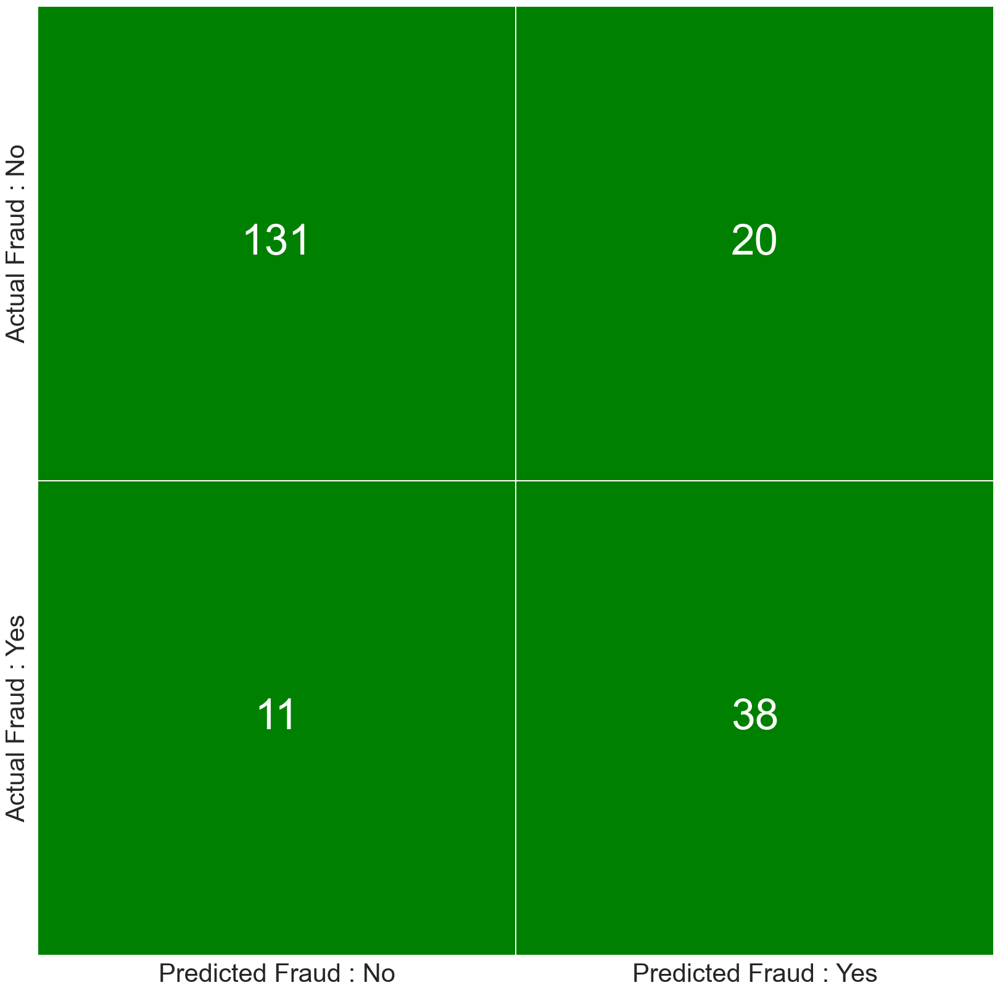

In [122]:
draw_confusion_matrix(gb_boost_tuned,X_test_signi_gb,y_test)

In [123]:
# Here we have improve the overall model by using hyperparameter tuning

In [124]:
cross_validate(XGBClassifier(random_state=10),10)

(array([0.88520833, 0.86291667, 0.88375   , 0.91629583, 0.90336936]),
 Index(['policy_deductable', 'umbrella_limit', 'insured_zip', 'capital-gains',
        'witnesses', 'insured_hobbies', 'insured_relationship',
        'collision_type', 'incident_severity', 'authorities_contacted'],
       dtype='object'))

In [125]:
X_new_signi = X_new_vif[cross_validate(XGBClassifier(random_state=10),10)[1]]
X_train_signi_xgb,X_test_signi_xgb,y_train,y_test = train_test_split(X_new_signi,y,random_state=10,test_size=0.2)

print(X_train_signi_xgb.shape)
print(X_test_signi_xgb.shape)
print(y_train.shape)
print(y_test.shape)

(800, 10)
(200, 10)
(800,)
(200,)


In [126]:
param_list = [{'n_estimators':[10,25,50,75,100,200],
              'learning_rate':[0.1,0.01,0.05,0.15],
              'max_depth':[3,10,15,20,25]}]

xgb2 =  XGBClassifier(random_state=10)
kf = KFold(n_splits=5)
grid2 = GridSearchCV(estimator=xgb2,param_grid=param_list,scoring='roc_auc',cv=kf,verbose=2,n_jobs=2)
grid2.fit(X_train_signi_xgb,y_train)
print('Best Param for Xtreme Gradient Boasting ',grid2.best_params_)
print('Best Score for Xtreme Gradient Boasting ',grid2.best_score_)

Fitting 5 folds for each of 120 candidates, totalling 600 fits
Best Param for Xtreme Gradient Boasting  {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 200}
Best Score for Xtreme Gradient Boasting  0.907212753551381


In [127]:
xgb_boost_tuned = XGBClassifier(n_estimators=grid2.best_params_['n_estimators'],learning_rate=grid2.best_params_['learning_rate'],
                                  max_depth=grid2.best_params_['max_depth'],random_state=10)
xgb_boost_tuned.fit(X_train_signi_xgb,y_train)
eval_metric(xgb_boost_tuned,X_test_signi_xgb,y_test)

Accuracy Score :  0.84
Recall Score :  0.673469387755102
Precision Score : 0.673469387755102
F1 Score :  0.673469387755102
Cohen_kappa_score :  0.5675091228544398
Roc_auc_score :  0.78375456142722
*************************************************************************
Confusion Matrix :
  [[135  16]
 [ 16  33]]
*************************************************************************
Classification Report: 
               precision    recall  f1-score   support

           0       0.89      0.89      0.89       151
           1       0.67      0.67      0.67        49

    accuracy                           0.84       200
   macro avg       0.78      0.78      0.78       200
weighted avg       0.84      0.84      0.84       200



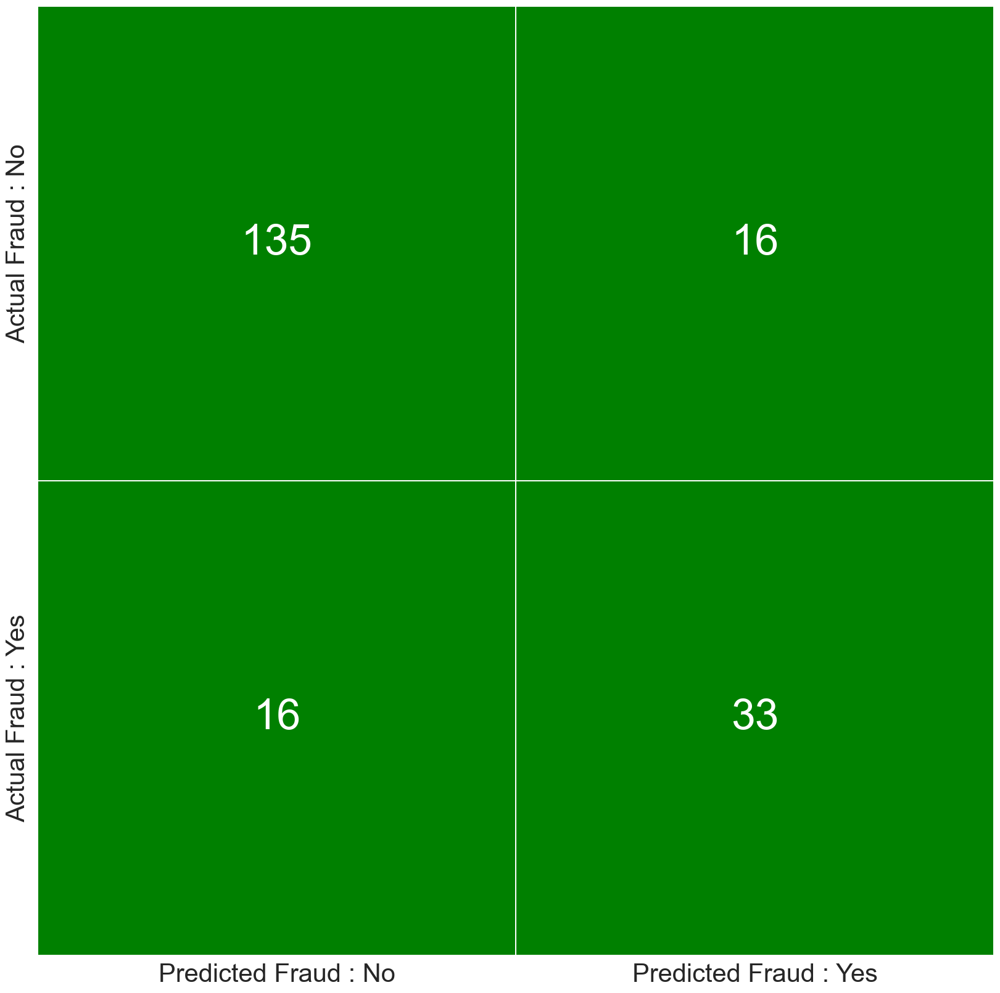

In [128]:
draw_confusion_matrix(xgb_boost_tuned,X_test_signi_xgb,y_test)

In [129]:
# We have significantly improve the performance by using Hyperparameter Tuning
# Let try to handle data imbalance

# Handling Data Imbalance

In [130]:
smote = SMOTE(sampling_strategy='auto' ,random_state=10)
oversample_X,oversample_y = smote.fit_resample(X_new_vif,y)
oversampled = pd.concat([oversample_X,oversample_y],axis=1)
oversampled.head()

,policy_deductable,umbrella_limit,insured_zip,capital-gains,bodily_injuries,witnesses,vehicle_claim,auto_year,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,auto_make,fraud_reported
0,0.33333,0.09091,0.18877,0.53035,0.5,0.66667,0.65430,0.45,2,1,1,4,2,17,0,2,2,0,4,4,1,10,1
1,1.00000,0.54545,0.19948,0.00000,0.0,0.00000,0.04328,0.60,1,1,1,4,6,15,2,3,1,1,4,5,5,8,1
2,1.00000,0.54545,0.00277,0.34925,1.0,1.00000,0.28972,0.60,2,0,0,6,11,2,3,0,1,1,4,1,1,4,0
3,1.00000,0.63636,0.93270,0.48657,0.5,0.66667,0.63719,0.95,0,1,0,6,1,2,4,2,0,0,4,2,0,3,1
4,0.33333,0.63636,0.94626,0.65672,0.0,0.33333,0.05636,0.70,0,2,1,0,11,2,4,3,1,1,2,1,0,0,0


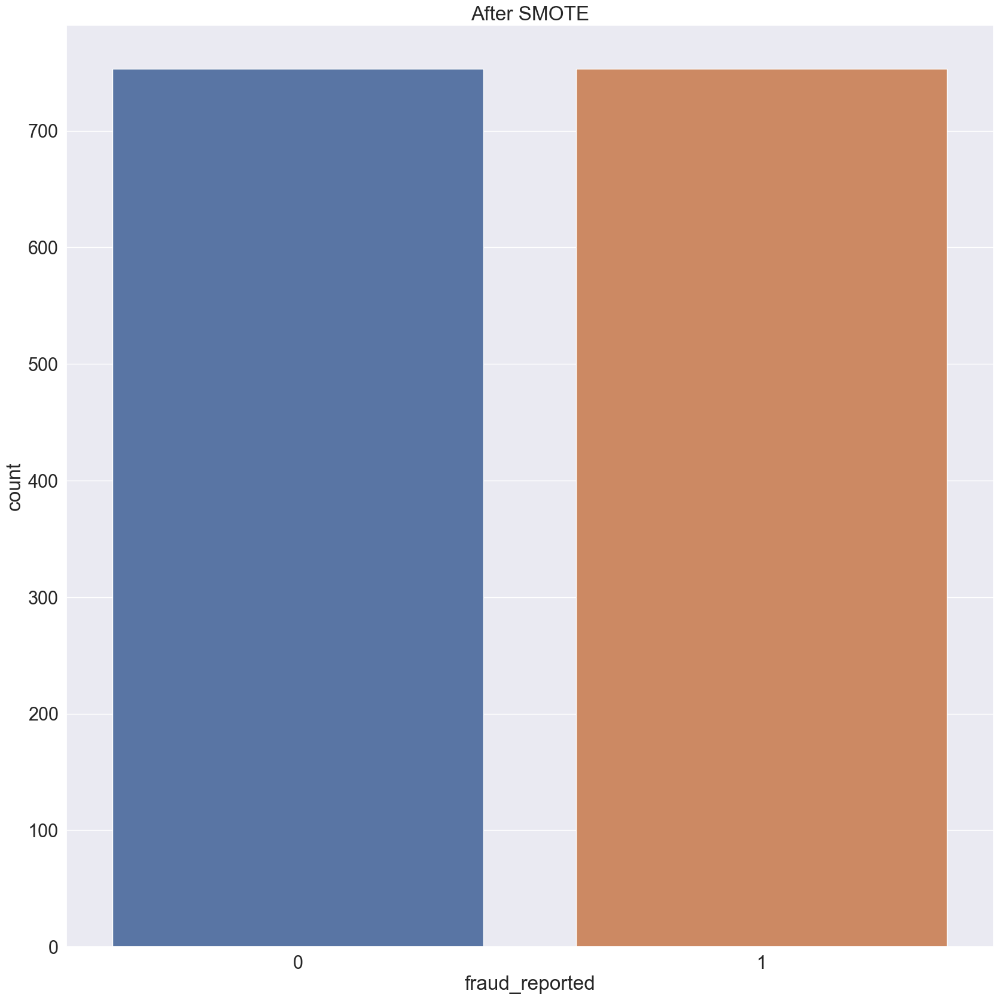

In [131]:
sns.countplot(x=oversampled['fraud_reported'])
plt.title('After SMOTE');

In [132]:
X_train_signi_gb,X_test_signi_gb,y_train,y_test = train_test_split(oversample_X,oversample_y,random_state=10,test_size=0.2)

print(X_train_signi_gb.shape)
print(X_test_signi_gb.shape)
print(y_train.shape)
print(y_test.shape)

(1204, 22)
(302, 22)
(1204,)
(302,)


In [133]:
gb_boost2 = GradientBoostingClassifier(random_state=10)
gb_boost2.fit(X_train_signi_gb,y_train)
y_pred = gb_boost2.predict(X_test_signi_gb)
confusion_matrix(y_true=y_test,y_pred=y_pred)

array([[122,  22],
       [ 15, 143]], dtype=int64)

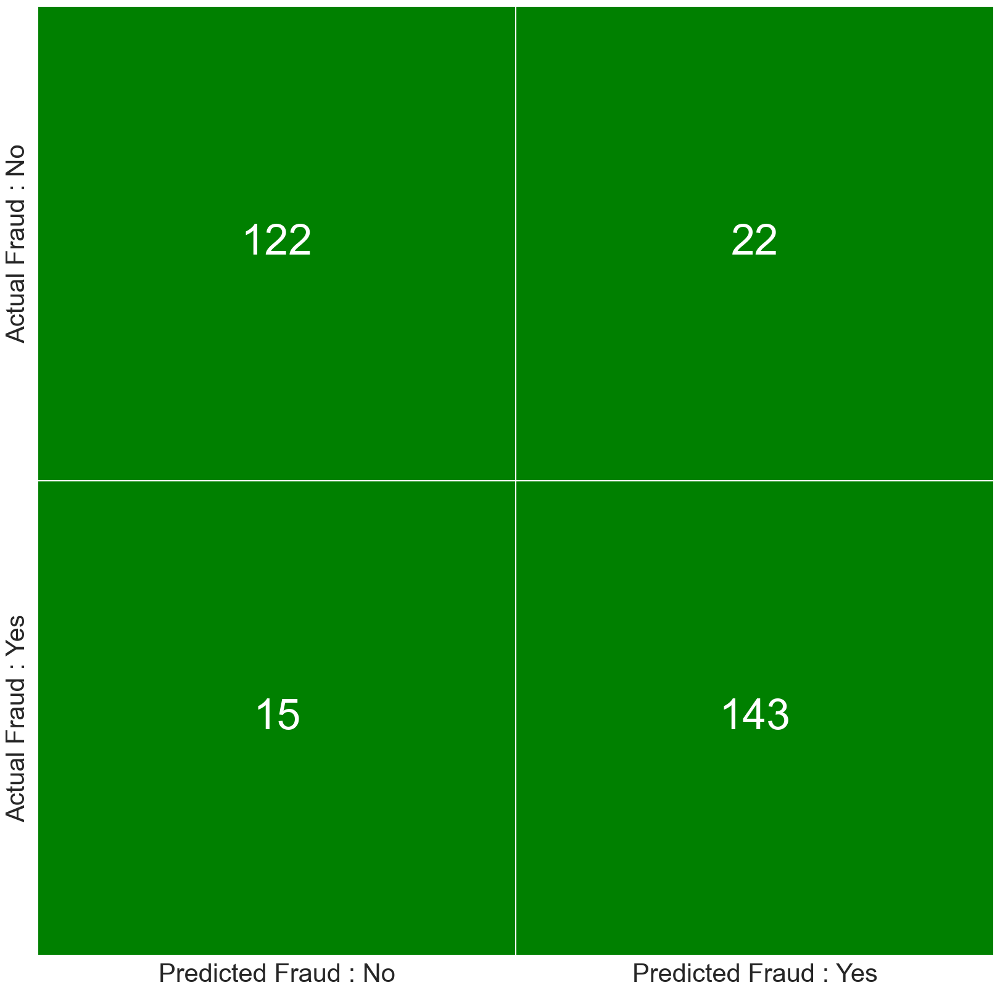

In [134]:
draw_confusion_matrix(gb_boost2,X_test_signi_gb,y_test)

In [135]:
rfe_gb = RFE(estimator=GradientBoostingClassifier(random_state=10),n_features_to_select=6,importance_getter='auto')
rfe_gb.fit(X_train_signi_gb,y_train)

feat_index_gb = pd.Series(rfe_gb.ranking_,index=X_train_signi_gb.columns)

signi_feat_gb = feat_index_gb[feat_index_gb==1].index
signi_feat_gb

Index(['insured_zip', 'bodily_injuries', 'witnesses', 'auto_year',
       'insured_hobbies', 'incident_severity'],
      dtype='object')

In [136]:
X_new_signi2 = oversample_X[signi_feat_gb]

X_train_signi_gb2,X_test_signi_gb2,y_train,y_test = train_test_split(X_new_signi2,oversample_y,random_state=10,test_size=0.2)

print(X_train_signi_gb2.shape)
print(X_test_signi_gb2.shape)
print(y_train.shape)
print(y_test.shape)

(1204, 6)
(302, 6)
(1204,)
(302,)


In [137]:
kf =KFold(n_splits=5)
scores_val_score = cross_val_score(estimator=GradientBoostingClassifier(random_state=10),
                                   X=X_train_signi_gb2,y=y_train,scoring='roc_auc')
print(scores_val_score)
print(np.average(scores_val_score))
print(np.std(scores_val_score))

[0.95557239 0.95261055 0.93504615 0.94496487 0.97291479]
0.952221750372009
0.012547854338196881


In [138]:
param_list = [{'n_estimators':[10,50,100,200,250],
              'learning_rate':[0.1,0.01,0.05,0.2],
              'max_depth':[3,10,15],
              'max_features':[3,4,5,6]}]

gb2 =  GradientBoostingClassifier(random_state=10)
kf = KFold(n_splits=5)
grid2 = GridSearchCV(estimator=gb2,param_grid=param_list,scoring='roc_auc',cv=kf,verbose=2,n_jobs=2)
grid2.fit(X_train_signi_gb2,y_train)
print('Best Param for  Gradient Boasting ',grid2.best_params_)
print('Best Score for  Gradient Boasting ',grid2.best_score_)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Best Param for  Gradient Boasting  {'learning_rate': 0.1, 'max_depth': 3, 'max_features': 5, 'n_estimators': 200}
Best Score for  Gradient Boasting  0.9540380527148183


In [139]:
gb_boost_tuned2 = GradientBoostingClassifier(n_estimators=grid2.best_params_['n_estimators'],learning_rate=grid2.best_params_['learning_rate'],
                                  max_depth=grid2.best_params_['max_depth'],max_features=grid2.best_params_['max_features'],random_state=10)
gb_boost_tuned2.fit(X_train_signi_gb2,y_train)
eval_metric(gb_boost_tuned2,X_test_signi_gb2,y_test)

Accuracy Score :  0.9072847682119205
Recall Score :  0.9177215189873418
Precision Score : 0.90625
F1 Score :  0.9119496855345911
Cohen_kappa_score :  0.8140557656785997
Roc_auc_score :  0.9067774261603376
*************************************************************************
Confusion Matrix :
  [[129  15]
 [ 13 145]]
*************************************************************************
Classification Report: 
               precision    recall  f1-score   support

           0       0.91      0.90      0.90       144
           1       0.91      0.92      0.91       158

    accuracy                           0.91       302
   macro avg       0.91      0.91      0.91       302
weighted avg       0.91      0.91      0.91       302



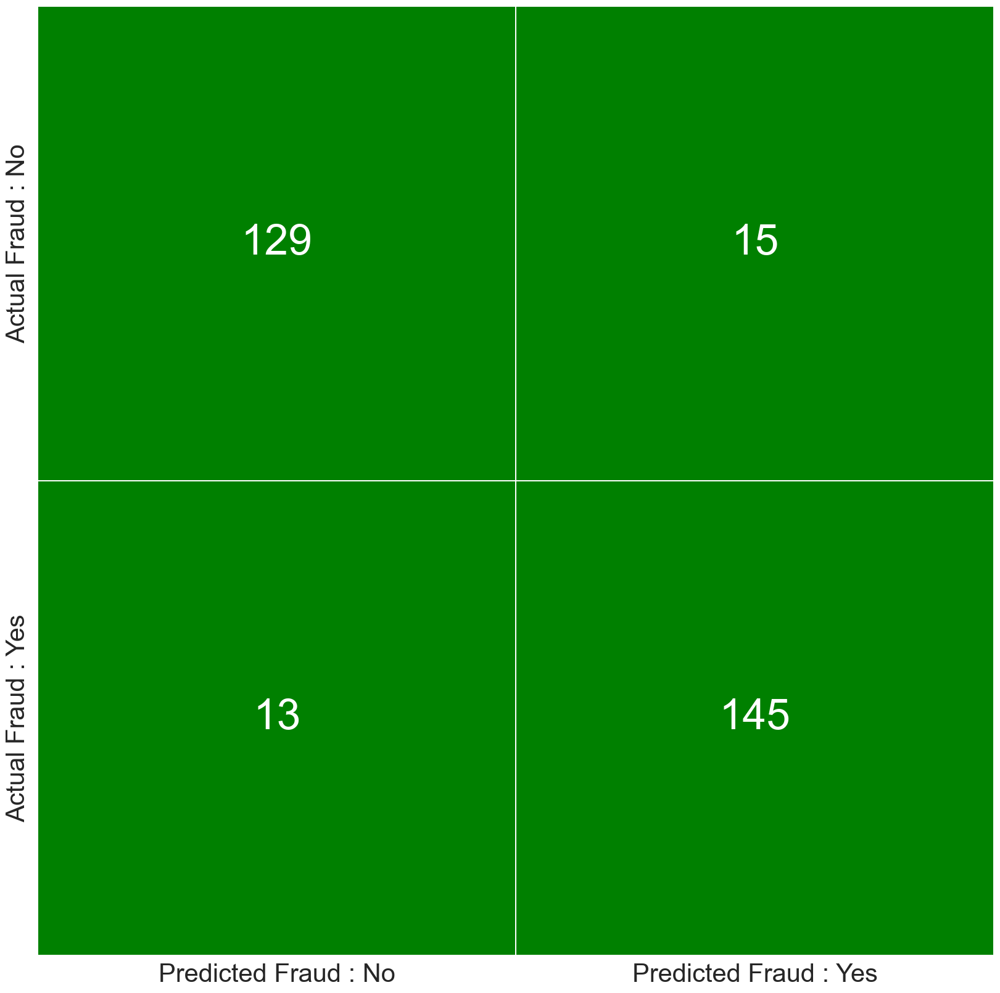

In [140]:
# type your code here
draw_confusion_matrix(gb_boost_tuned2,X_test_signi_gb2,y_test)

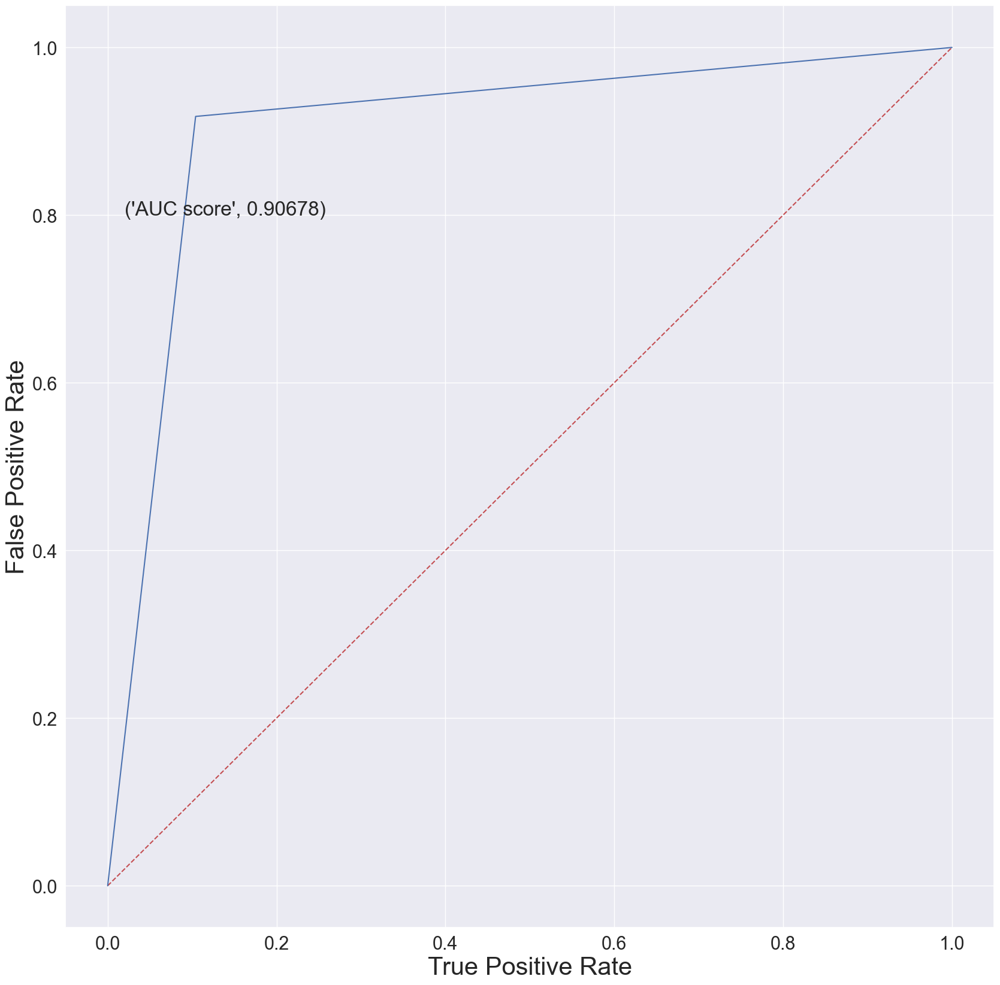

In [141]:
draw_roc_auc_curve(gb_boost_tuned2,X_test_signi_gb2,y_test)

In [142]:
# we can see that auc_roc_score is 90.6% which improve from the base model
# Also other matrix is score look good and consist
# SMOTE analysis help us to improve the overall performance but it create synthetic data
# We can conclude the model with Gradient Boasting with hyperparamter is the best model

In [143]:
xgb_boost2 = XGBClassifier(n_estimators=125,max_depth = 4,booster='gbtree',learning_rate=0.35,reg_lambda=1,random_state=10)
xgb_boost2.fit(X_train_signi_gb2,y_train)
eval_metric(xgb_boost2,X_test_signi_gb2,y_test)

Accuracy Score :  0.9271523178807947
Recall Score :  0.9367088607594937
Precision Score : 0.925
F1 Score :  0.9308176100628932
Cohen_kappa_score :  0.8539009587474712
Roc_auc_score :  0.9266877637130803
*************************************************************************
Confusion Matrix :
  [[132  12]
 [ 10 148]]
*************************************************************************
Classification Report: 
               precision    recall  f1-score   support

           0       0.93      0.92      0.92       144
           1       0.93      0.94      0.93       158

    accuracy                           0.93       302
   macro avg       0.93      0.93      0.93       302
weighted avg       0.93      0.93      0.93       302



In [144]:
xgb_boost2 = XGBClassifier(n_estimators=125,max_depth = 4,learning_rate=0.35,random_state=10)
xgb_boost2.fit(X_train_signi_gb2,y_train)
eval_metric(xgb_boost2,X_test_signi_gb2,y_test)

Accuracy Score :  0.9271523178807947
Recall Score :  0.9367088607594937
Precision Score : 0.925
F1 Score :  0.9308176100628932
Cohen_kappa_score :  0.8539009587474712
Roc_auc_score :  0.9266877637130803
*************************************************************************
Confusion Matrix :
  [[132  12]
 [ 10 148]]
*************************************************************************
Classification Report: 
               precision    recall  f1-score   support

           0       0.93      0.92      0.92       144
           1       0.93      0.94      0.93       158

    accuracy                           0.93       302
   macro avg       0.93      0.93      0.93       302
weighted avg       0.93      0.93      0.93       302



In [145]:
dt2 = DecisionTreeClassifier(max_depth=7,min_samples_split=4,random_state=10)
dt2.fit(X_train_signi_gb2,y_train)
eval_metric(dt2,X_test_signi_gb2,y_test)

Accuracy Score :  0.8543046357615894
Recall Score :  0.8481012658227848
Precision Score : 0.8701298701298701
F1 Score :  0.8589743589743589
Cohen_kappa_score :  0.7083406496927129
Roc_auc_score :  0.854606188466948
*************************************************************************
Confusion Matrix :
  [[124  20]
 [ 24 134]]
*************************************************************************
Classification Report: 
               precision    recall  f1-score   support

           0       0.84      0.86      0.85       144
           1       0.87      0.85      0.86       158

    accuracy                           0.85       302
   macro avg       0.85      0.85      0.85       302
weighted avg       0.85      0.85      0.85       302



In [146]:
rf2 = RandomForestClassifier(random_state=10)
rf2.fit(X_train_signi_gb2,y_train)
eval_metric(rf2,X_test_signi_gb2,y_test)

Accuracy Score :  0.8807947019867549
Recall Score :  0.9050632911392406
Precision Score : 0.8719512195121951
F1 Score :  0.8881987577639753
Cohen_kappa_score :  0.7606340819022457
Roc_auc_score :  0.8796149789029535
*************************************************************************
Confusion Matrix :
  [[123  21]
 [ 15 143]]
*************************************************************************
Classification Report: 
               precision    recall  f1-score   support

           0       0.89      0.85      0.87       144
           1       0.87      0.91      0.89       158

    accuracy                           0.88       302
   macro avg       0.88      0.88      0.88       302
weighted avg       0.88      0.88      0.88       302



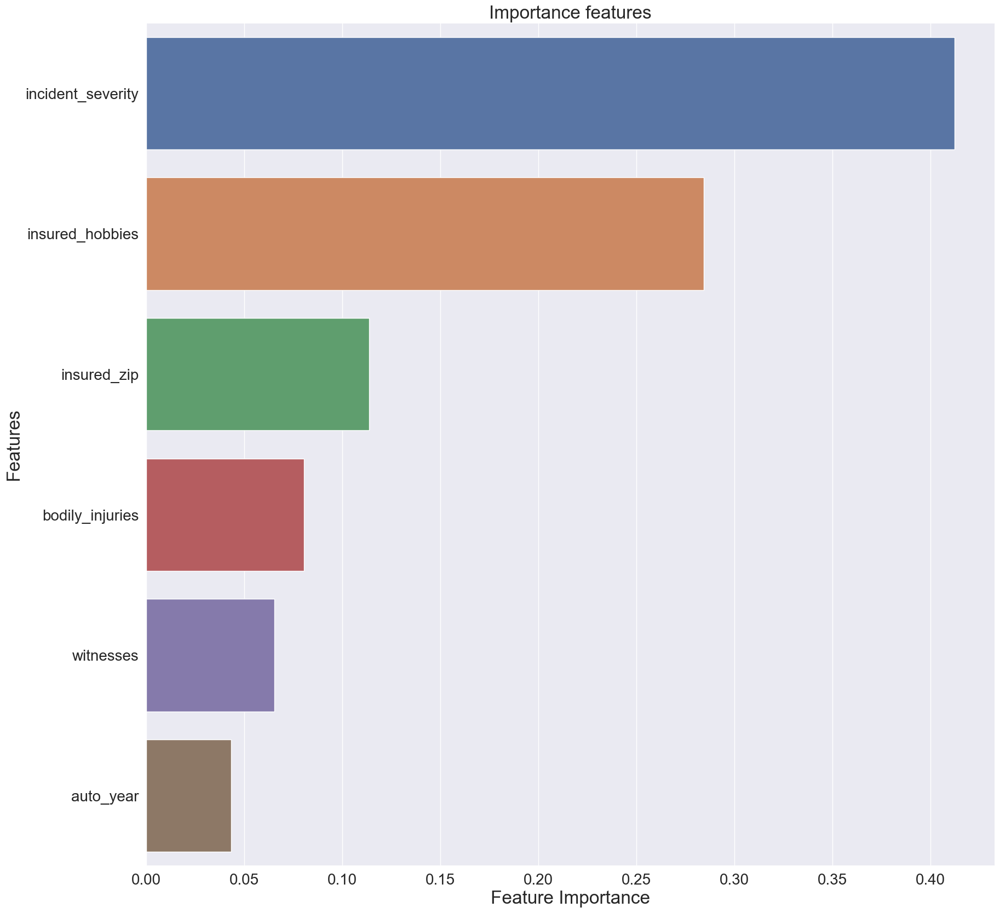

In [147]:
df_feature_importance = pd.DataFrame({'Features':X_train_signi_gb2.columns,
                                      'Feature Importance':gb_boost_tuned2.feature_importances_})
df_feature_importance = df_feature_importance.sort_values(by='Feature Importance',ascending=False)
sns.barplot(data=df_feature_importance,x='Feature Importance',y='Features')
plt.title('Importance features')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [148]:
# incident_severity is most important feature followed by insured_hobbies and bodily_injuries that help us to detemine the
# target column

base_learners = [('Random Forest',RandomForestClassifier(n_estimators=200,max_depth=20,random_state=10)),
                ('Decision Tree',DecisionTreeClassifier(max_depth=10,random_state=3)),
                ('Ada Boosting',AdaBoostClassifier(learning_rate=1,random_state=2)),
                ('Gradient Boosting',GradientBoostingClassifier(learning_rate=0.1,random_state=3)),
                ('XGB Boosting',XGBClassifier(n_estimators=200,random_state=1)),
                ('KNN',KNeighborsClassifier(n_neighbors=3))]

skf = StratifiedKFold(n_splits=10)
stack_gb = StackingClassifier(estimators=base_learners,final_estimator=LogisticRegression(random_state=20)
                              ,cv=skf,passthrough=True,stack_method='predict')
stack_gb.fit(X_train_signi_gb2,y_train)
eval_metric(stack_gb,X_test_signi_gb2,y_test)

In [176]:
base_learners = [('Random Forest',RandomForestClassifier(n_estimators=200,max_depth=20,random_state=10)),
                ('Decision Tree',DecisionTreeClassifier(max_depth=10,random_state=3)),
                ('Ada Boosting',AdaBoostClassifier(learning_rate=1,random_state=2)),
                ('Gradient Boosting',GradientBoostingClassifier(n_estimators=90,learning_rate=0.1,random_state=3)),
                ('XGB Boosting',XGBClassifier(n_estimators=200,random_state=1)),
                ('KNN',KNeighborsClassifier(n_neighbors=3))]

skf = StratifiedKFold(n_splits=10)
stack_gb = StackingClassifier(estimators=base_learners,final_estimator=LogisticRegression(random_state=20)
                              ,cv=skf,passthrough=True,stack_method='predict')
stack_gb.fit(X_train_signi_gb2,y_train)
eval_metric(stack_gb,X_test_signi_gb2,y_test)

Accuracy Score :  0.9205298013245033
Recall Score :  0.9430379746835443
Precision Score : 0.9085365853658537
F1 Score :  0.9254658385093167
Cohen_kappa_score :  0.8404227212681638
Roc_auc_score :  0.919435654008439
*************************************************************************
Confusion Matrix :
  [[129  15]
 [  9 149]]
*************************************************************************
Classification Report: 
               precision    recall  f1-score   support

           0       0.93      0.90      0.91       144
           1       0.91      0.94      0.93       158

    accuracy                           0.92       302
   macro avg       0.92      0.92      0.92       302
weighted avg       0.92      0.92      0.92       302



In [217]:
base_learners = [('Random Forest',RandomForestClassifier(n_estimators=175,max_depth=20,oob_score=True,
                                                         max_features=2,random_state=10)),
                ('Decision Tree',DecisionTreeClassifier(max_depth=10,splitter='best',random_state=3)),
                ('Ada Boosting',AdaBoostClassifier(learning_rate=1,random_state=2)),
                ('Gradient Boosting',GradientBoostingClassifier(n_estimators=90,learning_rate=0.1,random_state=3)),
                ('XGB Boosting',XGBClassifier(n_estimators=200,random_state=1)),
                ('KNN',KNeighborsClassifier(n_neighbors=3))]

skf = StratifiedKFold(n_splits=10)
stack_gb = StackingClassifier(estimators=base_learners,final_estimator=LogisticRegression(random_state=20)
                              ,cv=skf,passthrough=True,stack_method='predict',verbose=3,)
stack_gb.fit(X_train_signi_gb2,y_train)
eval_metric(stack_gb,X_test_signi_gb2,y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concur

Accuracy Score :  0.9205298013245033
Recall Score :  0.9430379746835443
Precision Score : 0.9085365853658537
F1 Score :  0.9254658385093167
Cohen_kappa_score :  0.8404227212681638
Roc_auc_score :  0.919435654008439
*************************************************************************
Confusion Matrix :
  [[129  15]
 [  9 149]]
*************************************************************************
Classification Report: 
               precision    recall  f1-score   support

           0       0.93      0.90      0.91       144
           1       0.91      0.94      0.93       158

    accuracy                           0.92       302
   macro avg       0.92      0.92      0.92       302
weighted avg       0.92      0.92      0.92       302



[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.0s finished


In [150]:
score = cross_val_score(estimator=stack_gb,X=X_train_signi_gb2,y=y_train,cv=10,scoring='roc_auc')
print('Score ',score)
print('Max Score ',np.max(score))
print('Min Score ',np.min(score))
print('Average Score',np.average(score))
print('Standard Deviation ',np.std(score))

Score  [0.95628415 0.91748634 0.93005464 0.92404372 0.95637677 0.91191998
 0.9549875  0.95387608 0.91330925 0.95944444]
Max Score  0.9594444444444445
Min Score  0.9119199777716033
Average Score 0.9377782871785373
Standard Deviation  0.01908017520090511


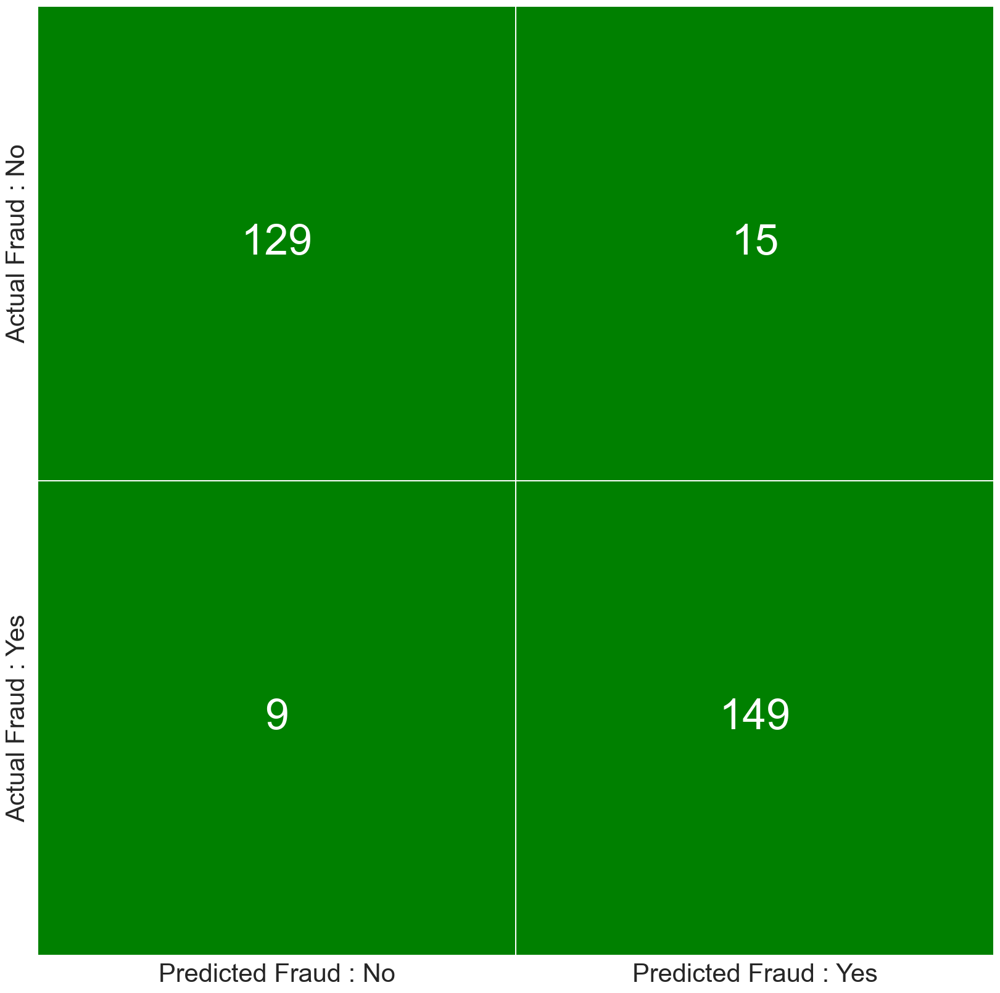

In [151]:
# type your code here
draw_confusion_matrix(stack_gb,X_test_signi_gb2,y_test)

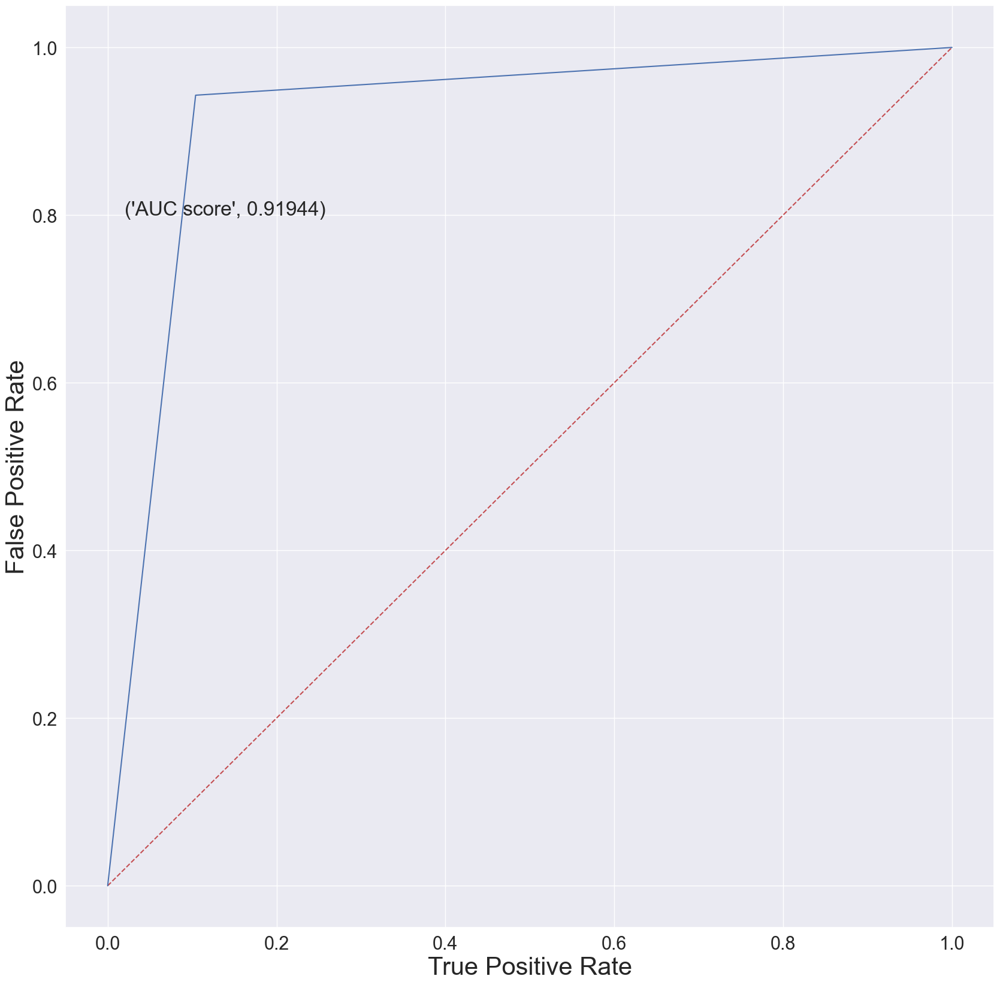

In [152]:
draw_roc_auc_curve(stack_gb,X_test_signi_gb2,y_test)

In [218]:
y_pred = stack_gb.predict(X_test_signi_gb2)

In [332]:
def draw_prec_rec_curve(model,X_test,y_test):
    y_pred = model.predict(X_test)
    precison,recall,thres = precision_recall_curve(y_test,y_pred)
    plt.plot([0.5,0.5],linestyle='--',color='r')
    plt.plot(recall,precison, marker='.')
    plt.text(x=0.94,y=0.92,s=('F1 score',round(f1_score(y_test,y_pred),3)))
    plt.axhline(y=0.908,linestyle='--',color='g')
    plt.axvline(x=0.943,linestyle='--',color='g')
    # axis labels
    plt.text(x=0.94,y=0.1,s=('Recall score',round(recall_score(y_test,y_pred),3)))
    plt.text(x=0.000001,y=0.908,s=('Precison score',round(precision_score(y_test,y_pred),3)))
    plt.xlabel('Recall Score')
    plt.ylabel('Precision Score')
    plt.xticks(np.arange(0.1,1.01,0.1))
    plt.yticks(np.arange(0.1,1.01,0.1))
    plt.grid(True)
    plt.show()

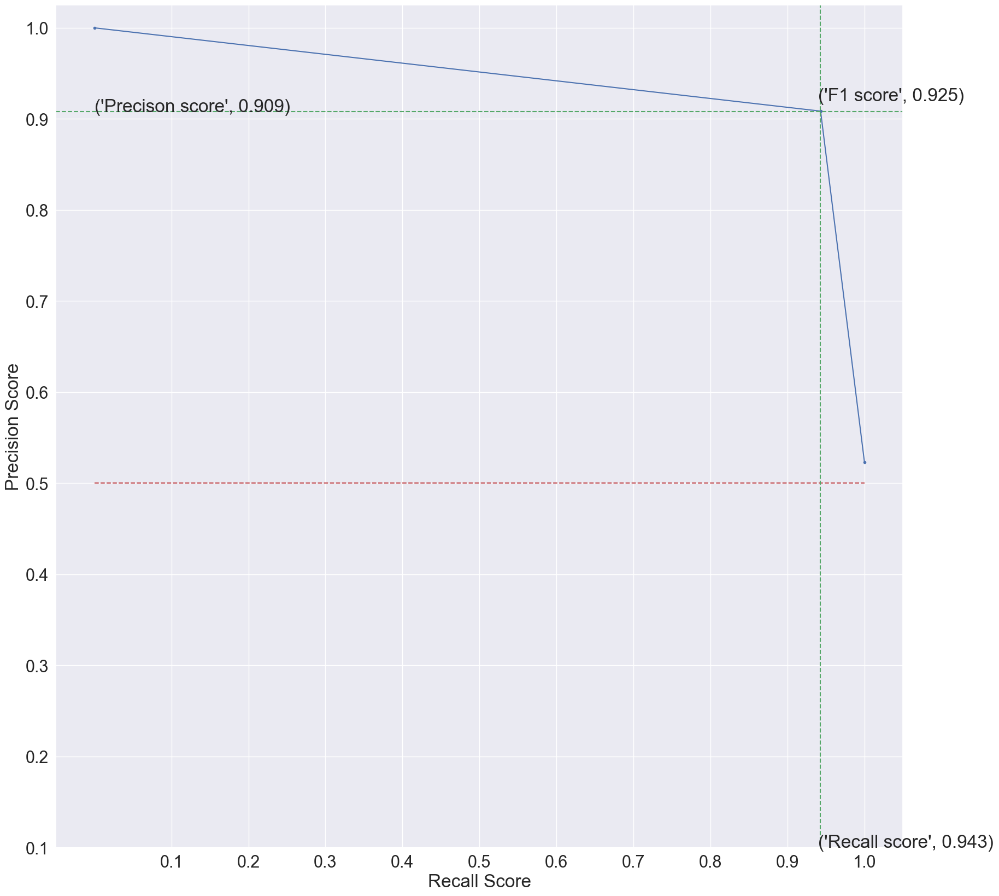

In [333]:
draw_prec_rec_curve(stack_gb,X_test_signi_gb2,y_test)

In [ ]:
# precision-recall curve and f1
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from matplotlib import pyplot
# generate 2 class dataset
X, y = make_classification(n_samples=1000, n_classes=2, random_state=1)
# split into train/test sets
trainX, testX, trainy, testy = train_test_split(X, y, test_size=0.5, random_state=2)
# fit a model
model = LogisticRegression(solver='lbfgs')
model.fit(trainX, trainy)
# predict probabilities
lr_probs = model.predict_proba(testX)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
# predict class values
yhat = model.predict(testX)
lr_precision, lr_recall, _ = precision_recall_curve(testy, lr_probs)
lr_f1, lr_auc = f1_score(testy, yhat), auc(lr_recall, lr_precision)
# summarize scores
print('Logistic: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))
# plot the precision-recall curves
no_skill = len(testy[testy==1]) / len(testy)
pyplot.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
pyplot.plot(lr_recall, lr_precision, marker='.', label='Logistic')
# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()

In [219]:
prec,recall,thres = precision_recall_curve(y_test,y_pred)


(array([0.52317881, 0.90853659, 1.        ]),
 array([1.        , 0.94303797, 0.        ]),
 array([0, 1], dtype=int64))

In [ ]:
    plt.text(x=0.92,y=0.9,s=('AUC score',round(roc_auc_score(y_test,y_pred),5)))
    plt.xlabel('True Positive Rate',fontsize=30)
    plt.ylabel('False Positive Rate',fontsize=30)